# Hand Gesture Classification using EMG

**EMG Pattern Classification**

For recording patterns, the authors (1) used a MYO Thalmic bracelet worn on a user’s forearm, and a PC with a Bluetooth receiver. The bracelet is equipped with **eight sensors** equally spaced around the forearm that simultaneously acquire myographic signals. The signals are sent through a Bluetooth interface to a PC. 


    Author: Debanjan Saha, Tanmay Gupta, Ritika Rao
    College: Northeastern University
    Group: Project Group 7
    Batch: Wednesday
    Course: IE 7300
    Professor: Ramin M.

This dataset contains raw EMG data for **36** subjects while they performed series of static hand gestures.The subject performs two series, each of which consists of **six (seven) basic gestures**. Each gesture was **performed for 3 seconds** with a **pause** of **3 seconds between gestures**.

**Relevant Papers**:
1. Lobov S., Krilova N., Kastalskiy I., Kazantsev V., Makarov V.A. Latent Factors Limiting the Performance of sEMG-Interfaces. Sensors. 2018;18(4):1122. doi: 10.3390/s18041122

2. Côté Allard, Ulysse & Fall, C. L. & Campeau-Lecours, Alexandre & Gosselin, Clément & Laviolette, Francois & Gosselin, Benoit. (2017). Transfer Learning for sEMG Hand Gesture Recognition Using Convolutional Neural Networks. 10.1109/SMC.2017.8122854.


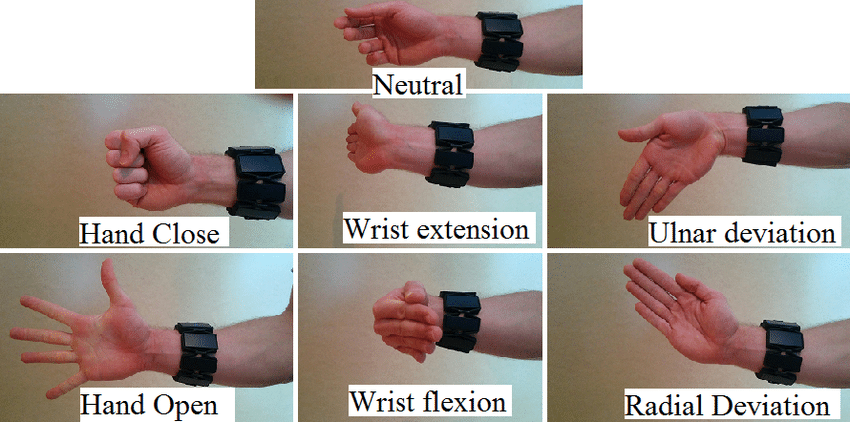

Image Source: Allard et. al (2)

## Import Libraries

In [1]:
# !pip install nolds
!pip install pycatch22
# !pip install torchsummary
# !pip install pyeeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 kB 1.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycatch22: filename=pycatch22-0.4.2-cp39-cp39-linux_x86_64.whl size=118676 sha256=41dac03b0cfff12fb27a7150c17a1e713c60e66f213dc6cae62e63e943b68cbb
  Stored in directory: /root/.cache/pip/wheels/c0/84/da/f210e9de22c6265163dac19287b0674e040605dfc519d83ca5
Successfully built pycatch22


In [2]:
import warnings
warnings.filterwarnings('ignore')
import os
import time
import operator
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# import pywt
# import librosa
# import nolds
# import pyeeg
warnings.filterwarnings('ignore')
sns.set_style('darkgrid')
from numpy.lib.stride_tricks import sliding_window_view
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_colwidth', 500)

In [3]:
import threading
import statistics
from scipy import stats
from scipy.fft import rfft, rfftfreq
from scipy.signal import butter, filtfilt, find_peaks
import pycatch22
import tensorflow as tf
from tensorflow import keras
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.utils.data import TensorDataset, DataLoader

In [4]:
from google.colab import drive, files
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [5]:
%cd '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master'
!ls -lrt

/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master
total 160884
-rw------- 1 root root     1453 Dec  7  2018 README.txt
-rw------- 1 root root    66860 Apr  5 05:42 Segmented_Catch22_Subject1.csv
-rw------- 1 root root 98805737 Apr 16 03:39 catch22_freq_dm.csv
drwx------ 2 root root     4096 Apr 17 00:12 Plots
drwx------ 2 root root     4096 Apr 17 00:12 Data
-rw------- 1 root root 32889929 Apr 17 10:35 compiled_train.csv
-rw------- 1 root root 32971863 Apr 17 10:35 compiled_test.csv


## Read Data

In [ ]:
# List out all the available files in the project's environment
files_path = set()
for dirname, _, filenames in os.walk('/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/'):
    for filename in filenames:
        f_path = os.path.join(dirname, filename)
        files_path.add(f_path)

In [ ]:
files_path.discard('/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/README.txt')
files_path.discard('/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/all_ext_features_data.csv')
files_path.discard('/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Segmented_Catch22_Subject1.csv')
files_path.discard('/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/catch22_freq_dm.csv')
files_path

{'/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/01/1_raw_data_13-12_22.03.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/01/2_raw_data_13-13_22.03.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/02/1_raw_data_14-19_22.03.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/02/2_raw_data_14-21_22.03.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/03/1_raw_data_09-32_11.04.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/03/2_raw_data_09-34_11.04.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures-master/Data/04/1_raw_data_18-02_24.04.16.txt',
 '/content/drive/MyDrive/Northeastern/Projects/IE7300 Project/EMG_data_for_gestures

In [ ]:
all_train = pd.DataFrame()
all_test = pd.DataFrame()
for id, file in enumerate(tqdm(sorted(files_path))):
    
    sub = int(file.split('/')[-2])
    data = pd.read_csv(file, sep='\t')
    subject_id = np.ones([len(data),1], dtype=np.int16)*sub
    print('\tSubject Id: \t', sub, '\tShape: ', subject_id.shape)
    # Add the subject into the data
    data['subject_id'] = subject_id
    if id%2 == 1: 
        all_train = pd.concat([all_train, data], axis=0, ignore_index=True, copy=True)
    else:
        all_test = pd.concat([all_test, data], axis=0, ignore_index=True, copy=True)

print('Total Training Records: ', all_train.shape)
print('Total Testing Records: ', all_test.shape)

  1%|▏         | 1/72 [00:00<00:28,  2.46it/s]

	Subject Id: 	 1 	Shape:  (63196, 1)


  3%|▎         | 2/72 [00:00<00:25,  2.72it/s]

	Subject Id: 	 1 	Shape:  (57974, 1)


  4%|▍         | 3/72 [00:01<00:25,  2.71it/s]

	Subject Id: 	 2 	Shape:  (72322, 1)


  6%|▌         | 4/72 [00:01<00:24,  2.77it/s]

	Subject Id: 	 2 	Shape:  (64104, 1)


  7%|▋         | 5/72 [00:01<00:26,  2.57it/s]

	Subject Id: 	 3 	Shape:  (56568, 1)


  8%|▊         | 6/72 [00:02<00:28,  2.30it/s]

	Subject Id: 	 3 	Shape:  (49217, 1)


 10%|▉         | 7/72 [00:02<00:27,  2.34it/s]

	Subject Id: 	 4 	Shape:  (59107, 1)


 11%|█         | 8/72 [00:03<00:25,  2.47it/s]

	Subject Id: 	 4 	Shape:  (55091, 1)


 12%|█▎        | 9/72 [00:03<00:28,  2.18it/s]

	Subject Id: 	 5 	Shape:  (57118, 1)


 14%|█▍        | 10/72 [00:04<00:26,  2.37it/s]

	Subject Id: 	 5 	Shape:  (50130, 1)


 15%|█▌        | 11/72 [00:04<00:24,  2.47it/s]

	Subject Id: 	 6 	Shape:  (51078, 1)


 17%|█▋        | 12/72 [00:04<00:25,  2.39it/s]

	Subject Id: 	 6 	Shape:  (48541, 1)


 18%|█▊        | 13/72 [00:05<00:25,  2.34it/s]

	Subject Id: 	 7 	Shape:  (68697, 1)


 19%|█▉        | 14/72 [00:05<00:24,  2.40it/s]

	Subject Id: 	 7 	Shape:  (63943, 1)


 21%|██        | 15/72 [00:06<00:24,  2.32it/s]

	Subject Id: 	 8 	Shape:  (60280, 1)


 22%|██▏       | 16/72 [00:06<00:23,  2.38it/s]

	Subject Id: 	 8 	Shape:  (57668, 1)


 24%|██▎       | 17/72 [00:07<00:22,  2.44it/s]

	Subject Id: 	 9 	Shape:  (62770, 1)


 25%|██▌       | 18/72 [00:07<00:22,  2.37it/s]

	Subject Id: 	 9 	Shape:  (64877, 1)


 26%|██▋       | 19/72 [00:07<00:22,  2.34it/s]

	Subject Id: 	 10 	Shape:  (61641, 1)


 28%|██▊       | 20/72 [00:08<00:21,  2.43it/s]

	Subject Id: 	 10 	Shape:  (61448, 1)


 29%|██▉       | 21/72 [00:08<00:22,  2.26it/s]

	Subject Id: 	 11 	Shape:  (74681, 1)


 31%|███       | 22/72 [00:09<00:22,  2.20it/s]

	Subject Id: 	 11 	Shape:  (72645, 1)


 32%|███▏      | 23/72 [00:09<00:21,  2.25it/s]

	Subject Id: 	 12 	Shape:  (65920, 1)


 33%|███▎      | 24/72 [00:10<00:19,  2.49it/s]

	Subject Id: 	 12 	Shape:  (62631, 1)


 35%|███▍      | 25/72 [00:10<00:19,  2.46it/s]

	Subject Id: 	 13 	Shape:  (75676, 1)


 36%|███▌      | 26/72 [00:10<00:19,  2.35it/s]

	Subject Id: 	 13 	Shape:  (77564, 1)


 38%|███▊      | 27/72 [00:11<00:18,  2.50it/s]

	Subject Id: 	 14 	Shape:  (52821, 1)


 39%|███▉      | 28/72 [00:11<00:17,  2.55it/s]

	Subject Id: 	 14 	Shape:  (48182, 1)


 40%|████      | 29/72 [00:11<00:16,  2.57it/s]

	Subject Id: 	 15 	Shape:  (53553, 1)


 42%|████▏     | 30/72 [00:12<00:15,  2.69it/s]

	Subject Id: 	 15 	Shape:  (51843, 1)


 43%|████▎     | 31/72 [00:12<00:15,  2.70it/s]

	Subject Id: 	 16 	Shape:  (55489, 1)


 44%|████▍     | 32/72 [00:13<00:14,  2.71it/s]

	Subject Id: 	 16 	Shape:  (50012, 1)


 46%|████▌     | 33/72 [00:13<00:14,  2.65it/s]

	Subject Id: 	 17 	Shape:  (65227, 1)


 47%|████▋     | 34/72 [00:13<00:14,  2.70it/s]

	Subject Id: 	 17 	Shape:  (66858, 1)


 49%|████▊     | 35/72 [00:14<00:13,  2.77it/s]

	Subject Id: 	 18 	Shape:  (62354, 1)


 50%|█████     | 36/72 [00:14<00:12,  2.81it/s]

	Subject Id: 	 18 	Shape:  (66958, 1)


 51%|█████▏    | 37/72 [00:14<00:12,  2.80it/s]

	Subject Id: 	 19 	Shape:  (58818, 1)


 53%|█████▎    | 38/72 [00:15<00:12,  2.73it/s]

	Subject Id: 	 19 	Shape:  (51088, 1)


 54%|█████▍    | 39/72 [00:15<00:12,  2.62it/s]

	Subject Id: 	 20 	Shape:  (65349, 1)


 56%|█████▌    | 40/72 [00:16<00:14,  2.28it/s]

	Subject Id: 	 20 	Shape:  (62504, 1)


 57%|█████▋    | 41/72 [00:16<00:14,  2.19it/s]

	Subject Id: 	 21 	Shape:  (62365, 1)


 58%|█████▊    | 42/72 [00:17<00:12,  2.34it/s]

	Subject Id: 	 21 	Shape:  (56882, 1)


 60%|█████▉    | 43/72 [00:17<00:12,  2.41it/s]

	Subject Id: 	 22 	Shape:  (61788, 1)


 61%|██████    | 44/72 [00:17<00:11,  2.53it/s]

	Subject Id: 	 22 	Shape:  (57841, 1)


 62%|██████▎   | 45/72 [00:18<00:10,  2.68it/s]

	Subject Id: 	 23 	Shape:  (60135, 1)


 64%|██████▍   | 46/72 [00:18<00:10,  2.37it/s]

	Subject Id: 	 23 	Shape:  (55484, 1)


 65%|██████▌   | 47/72 [00:19<00:10,  2.40it/s]

	Subject Id: 	 24 	Shape:  (61968, 1)


 67%|██████▋   | 48/72 [00:19<00:11,  2.18it/s]

	Subject Id: 	 24 	Shape:  (54972, 1)


 68%|██████▊   | 49/72 [00:20<00:10,  2.22it/s]

	Subject Id: 	 25 	Shape:  (62681, 1)


 69%|██████▉   | 50/72 [00:20<00:09,  2.28it/s]

	Subject Id: 	 25 	Shape:  (54066, 1)


 71%|███████   | 51/72 [00:21<00:10,  2.01it/s]

	Subject Id: 	 26 	Shape:  (56151, 1)


 72%|███████▏  | 52/72 [00:21<00:10,  1.87it/s]

	Subject Id: 	 26 	Shape:  (50003, 1)


 74%|███████▎  | 53/72 [00:22<00:09,  1.99it/s]

	Subject Id: 	 27 	Shape:  (56688, 1)


 75%|███████▌  | 54/72 [00:22<00:08,  2.19it/s]

	Subject Id: 	 27 	Shape:  (50111, 1)


 76%|███████▋  | 55/72 [00:22<00:07,  2.25it/s]

	Subject Id: 	 28 	Shape:  (50513, 1)


 78%|███████▊  | 56/72 [00:23<00:06,  2.43it/s]

	Subject Id: 	 28 	Shape:  (47253, 1)


 79%|███████▉  | 57/72 [00:23<00:05,  2.55it/s]

	Subject Id: 	 29 	Shape:  (53904, 1)


 81%|████████  | 58/72 [00:24<00:05,  2.46it/s]

	Subject Id: 	 29 	Shape:  (52083, 1)


 82%|████████▏ | 59/72 [00:24<00:05,  2.40it/s]

	Subject Id: 	 30 	Shape:  (77878, 1)


 83%|████████▎ | 60/72 [00:24<00:04,  2.43it/s]

	Subject Id: 	 30 	Shape:  (70683, 1)


 85%|████████▍ | 61/72 [00:25<00:04,  2.48it/s]

	Subject Id: 	 31 	Shape:  (44927, 1)


 86%|████████▌ | 62/72 [00:25<00:03,  2.62it/s]

	Subject Id: 	 31 	Shape:  (46096, 1)


 88%|████████▊ | 63/72 [00:25<00:03,  2.60it/s]

	Subject Id: 	 32 	Shape:  (62719, 1)


 89%|████████▉ | 64/72 [00:26<00:03,  2.23it/s]

	Subject Id: 	 32 	Shape:  (60211, 1)


 90%|█████████ | 65/72 [00:26<00:03,  2.29it/s]

	Subject Id: 	 33 	Shape:  (59017, 1)


 92%|█████████▏| 66/72 [00:27<00:02,  2.30it/s]

	Subject Id: 	 33 	Shape:  (53088, 1)


 93%|█████████▎| 67/72 [00:27<00:02,  2.26it/s]

	Subject Id: 	 34 	Shape:  (79765, 1)


 94%|█████████▍| 68/72 [00:28<00:01,  2.33it/s]

	Subject Id: 	 34 	Shape:  (51438, 1)


 96%|█████████▌| 69/72 [00:28<00:01,  2.43it/s]

	Subject Id: 	 35 	Shape:  (50417, 1)


 97%|█████████▋| 70/72 [00:29<00:00,  2.28it/s]

	Subject Id: 	 35 	Shape:  (49084, 1)


 99%|█████████▊| 71/72 [00:29<00:00,  2.17it/s]

	Subject Id: 	 36 	Shape:  (52390, 1)


100%|██████████| 72/72 [00:30<00:00,  2.40it/s]

	Subject Id: 	 36 	Shape:  (49364, 1)
Total Training Records:  (2041937, 11)
Total Testing Records:  (2195971, 11)


In [ ]:
all_train.head()

,time,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8,class,subject_id
0,2,-0.00001,-0.00004,-0.00002,-0.00002,-0.00001,-0.00001,0.00001,-0.00003,0,1
1,6,-0.00001,-0.00004,-0.00002,-0.00002,-0.00001,-0.00001,0.00001,-0.00003,0,1
2,7,-0.00001,-0.00004,-0.00002,-0.00002,-0.00001,-0.00001,0.00001,-0.00003,0,1
3,8,-0.00003,-0.00005,-0.00008,-0.00004,-0.00003,0.00000,-0.00002,0.00000,0,1
4,9,-0.00003,-0.00001,0.00000,0.00001,-0.00001,0.00000,0.00000,-0.00002,0,1


In [ ]:
all_test.head()

,time,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8,class,subject_id
0,1,0.00001,-0.00002,-0.00001,-0.00003,0.00000,-0.00001,0.00000,-0.00001,0.0,1
1,5,0.00001,-0.00002,-0.00001,-0.00003,0.00000,-0.00001,0.00000,-0.00001,0.0,1
2,6,-0.00001,0.00001,0.00002,0.00000,0.00001,-0.00002,-0.00001,0.00001,0.0,1
3,7,-0.00001,0.00001,0.00002,0.00000,0.00001,-0.00002,-0.00001,0.00001,0.0,1
4,8,-0.00001,0.00001,0.00002,0.00000,0.00001,-0.00002,-0.00001,0.00001,0.0,1


## Data Exploration
The data has the target variable `class` which can have values from 1 to 7, whereas, the data `class = 0` is unmarked data, which we have to infer with the model which has learned the gestures.

Here are the following gesture descriptions:
0. unmarked data,
1. hand at rest, 
2. hand clenched in a fist, 
3. wrist flexion,
4. wrist extension,
5. radial deviations,
6. ulnar deviations,
7. extended palm (the gesture was not performed by all subjects).

The data contains gesture class marked as 0 as an unsupervised classification problem. So, we shall be using the labeled data for our analysis.
So we can split the data into training and testing sets based on this `class` column, where all data for class = 0 will be our holdout data, and the labeled data will be for classes = 1,2,3,4,5,6, and 7.



### Channel-wise Time Distribution 

In [ ]:
import plotly
plotly.__version__

'5.13.1'

In [ ]:
CHANNELS = ["channel" + str(x) for x in range(1,9)]
SAMPLING_FREQ = 1000
NUM_SEGMENTS = 320


In [ ]:
def plot_all_channels(data, idx_start, idx_end, subject_id, filename):
    fig, axs = plt.subplots(len(data.columns), 1, figsize=(12, 20), sharex=True);
    for i, col in enumerate(data.columns):
        axs[i].plot(data[col].iloc[idx_start:idx_end], color=f'C{i}');
        axs[i].set_ylabel(col);
        axs[-1].set_xlabel("Time (samples)");
    plt.suptitle(f"Subject {subject_id}: EMG Signals for All Sensor Channels", fontsize=16, y=0.92);
    plt.savefig(filename, dpi=500, bbox_inches="tight");

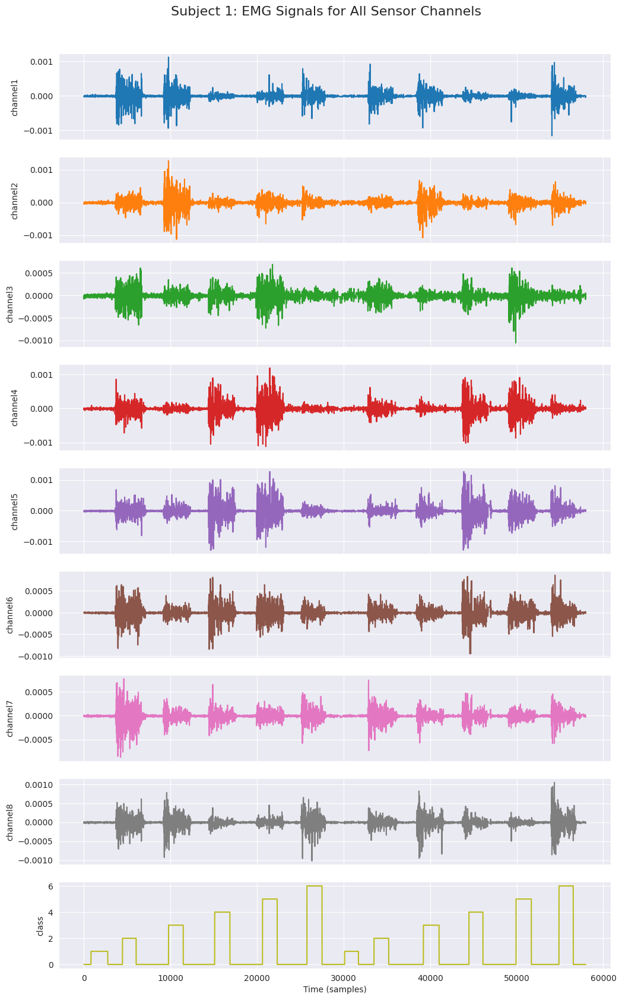

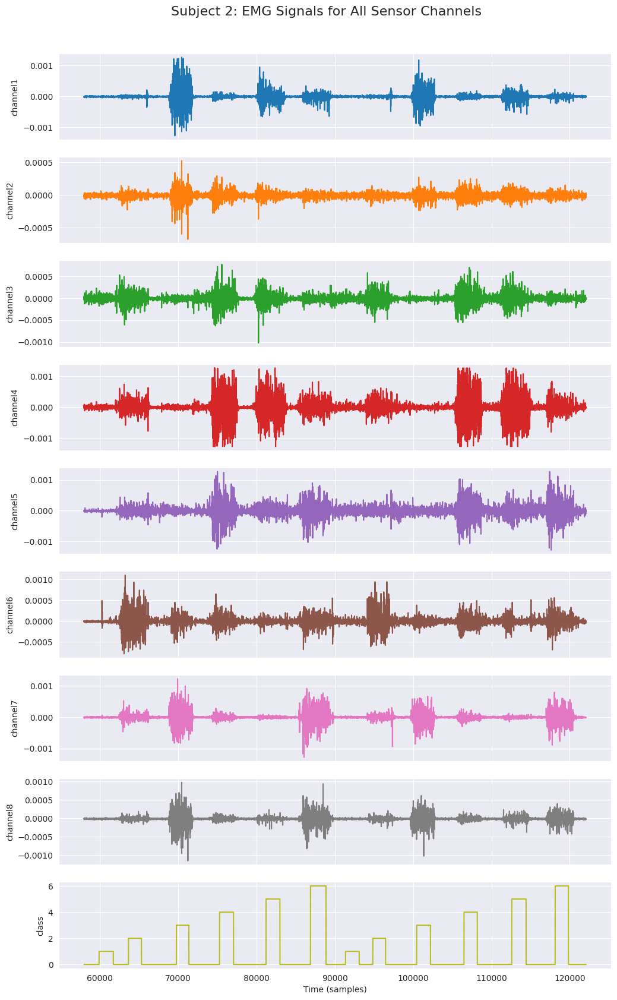

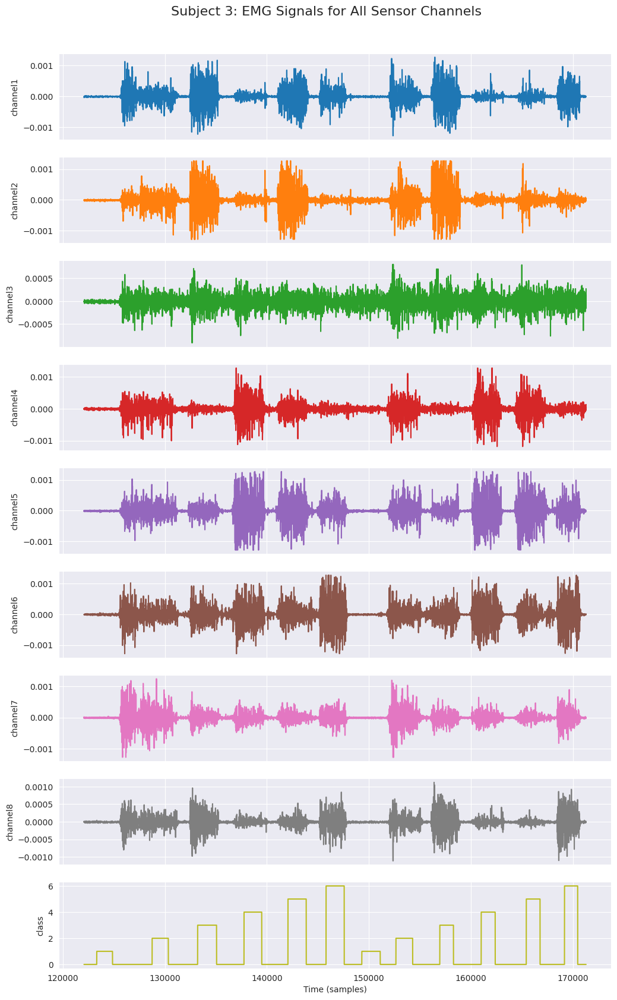

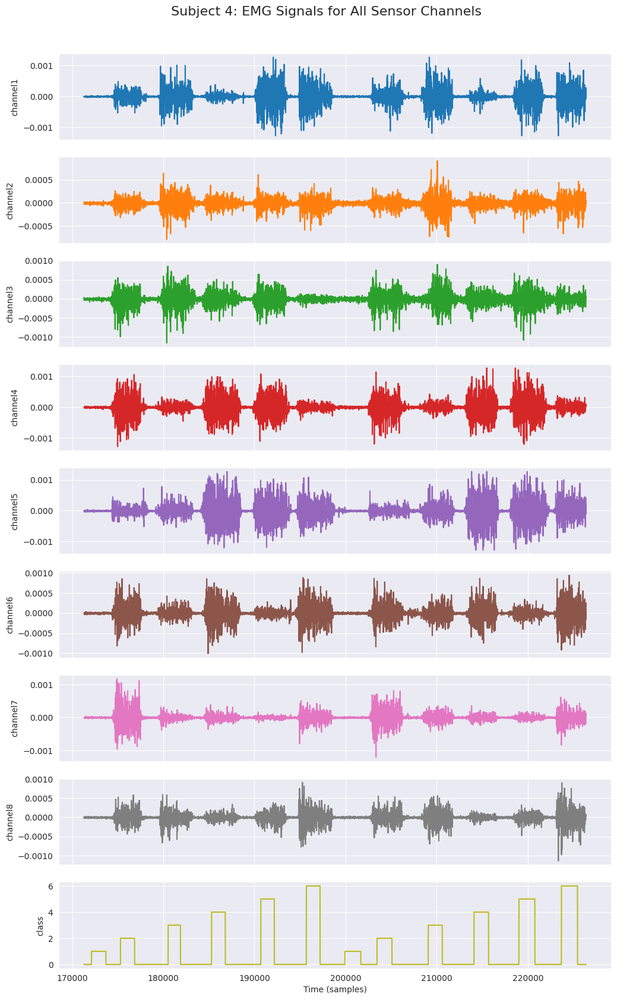

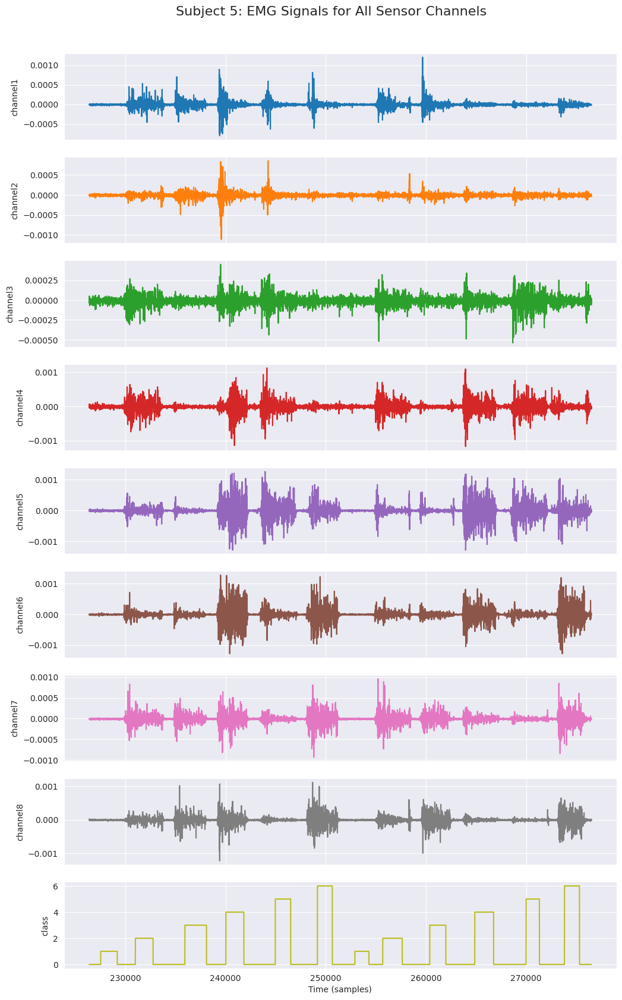

...

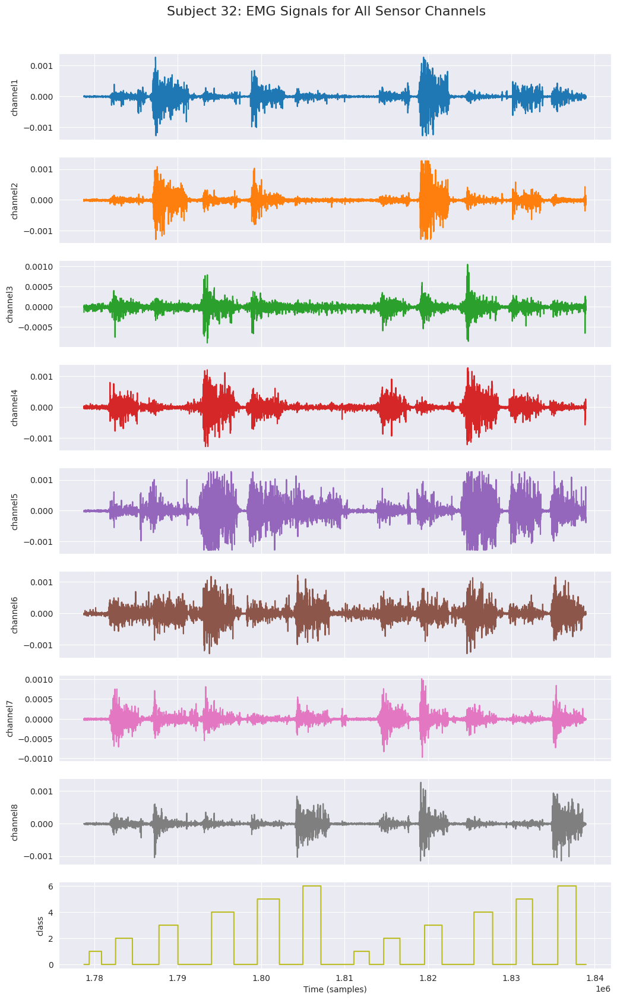

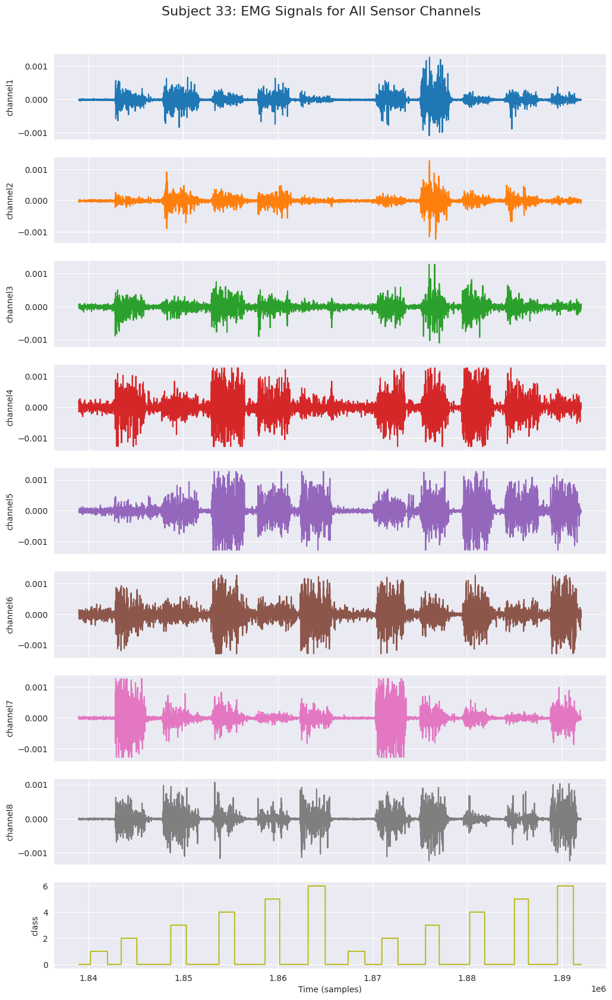

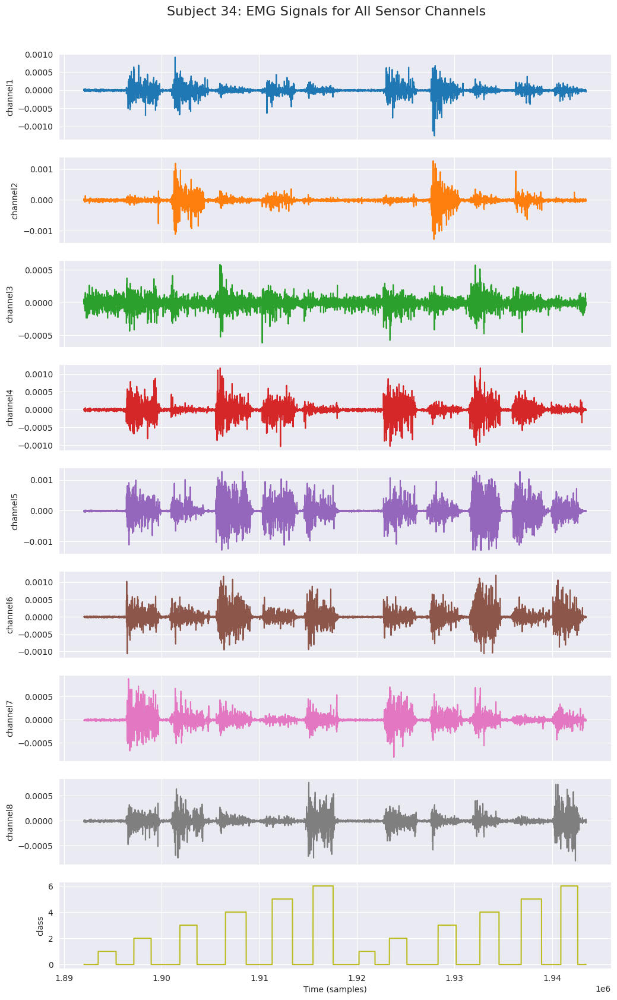

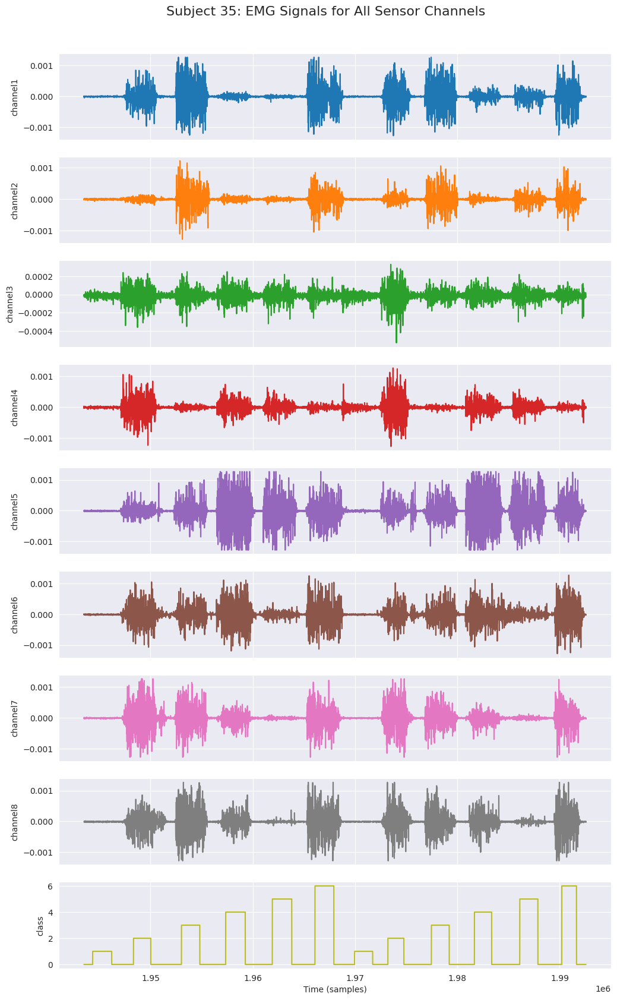

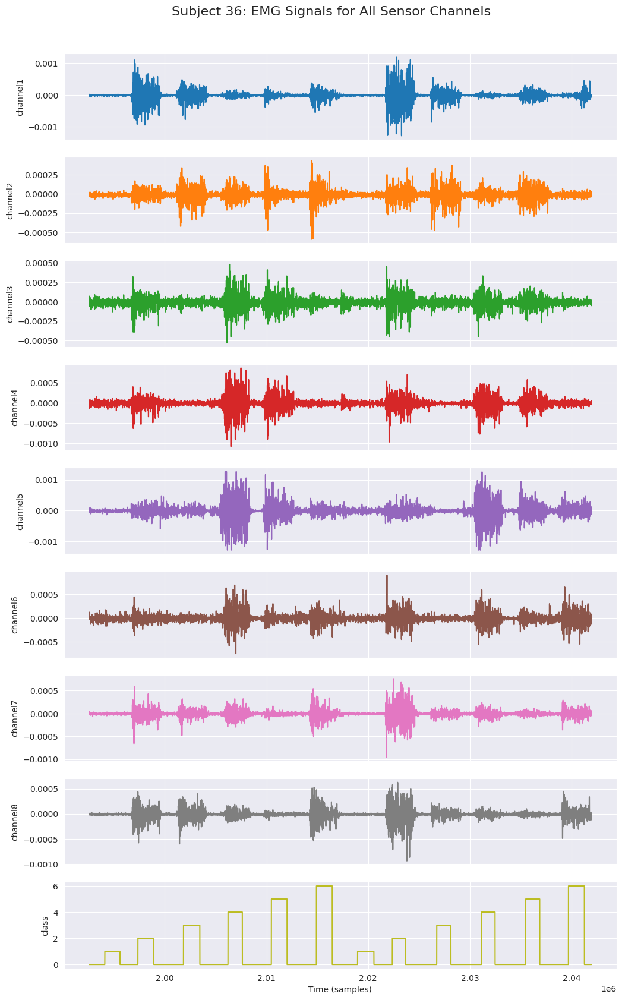

In [ ]:
for sub in range(1,37):
    sub_df = all_train[all_train['subject_id'] == sub].iloc[:,1:-1]
    plot_all_channels(sub_df, 0, len(sub_df), sub, f'Plots/All_Channels/Subject_{sub}_all_channels.png')

### Frequency Spectrum

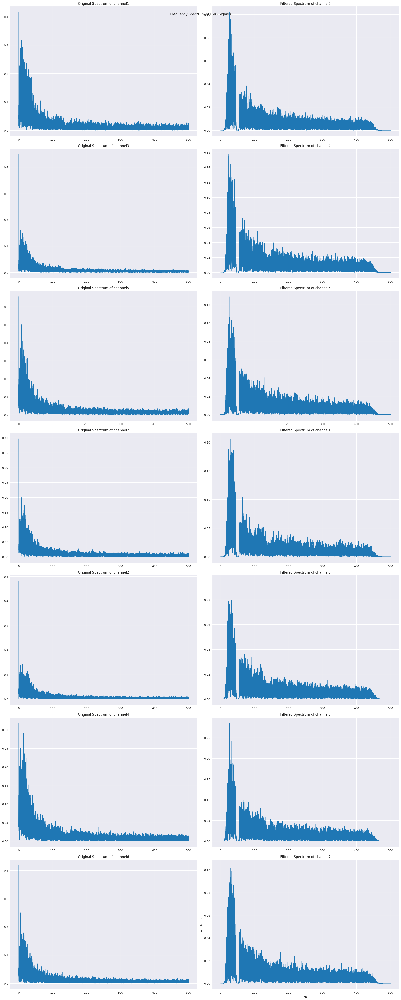

In [ ]:
def plot_freq_domain(signal, frequencies, ax, plot_title):
    '''Plots the frequency spectrum of a given signal'''
    frequency_spectrum = np.abs(rfft(signal)) # rfft as input is real numbers
    sns.lineplot(x=frequencies, y=frequency_spectrum, ax=ax)
    ax.set_title(plot_title)

def get_filter(filter_type, cutoff):
    # Compute Nyquist frequency
    nyquist_freq = SAMPLING_FREQ/2 # Hz
    # Convert cutoff frequencies to fractions of Nyquist frequency
    cutoff_freqs_frac = [x/nyquist_freq for x in cutoff]
    # Compute filter coefficients using Butterworth filter design
    b, a = butter(FILTER_ORDER, cutoff_freqs_frac, btype=filter_type, analog=False)
    # Return filter coefficients
    return b, a

# Set the filter order to 4
FILTER_ORDER = 4

# Define a bandpass filter with cutoff frequencies of 20 Hz and 450 Hz
cutoff_freqs = [20, 450] # Hz
b_bandpass, a_bandpass = get_filter('bandpass', cutoff_freqs)

# Define a bandstop filter with cutoff frequencies of 45 Hz and 55 Hz
cutoff_freqs = [45, 55]
b_bandstop, a_bandstop = get_filter('bandstop', cutoff_freqs)

fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(20, 50))
fig.suptitle('Frequency Spectrum of EMG Signals')

for i, ax in enumerate(axs.reshape(-1)):
    channel_name = f'channel{(i%7)+1}'
    unfiltered_signal = sub_df[channel_name].to_numpy()
    num_samples = len(unfiltered_signal)
    frequencies = rfftfreq(num_samples, 1/SAMPLING_FREQ) # get frequencies

    if i%2==0:
        plot_freq_domain(unfiltered_signal, frequencies, ax, f'Original Spectrum of {channel_name}')
    else:
        filtered_signal_1 = filtfilt(b_bandpass, a_bandpass, unfiltered_signal, padlen=0, axis=0)
        filtered_signal = filtfilt(b_bandstop, a_bandstop, filtered_signal_1, padlen=0, axis=0)
        plot_freq_domain(filtered_signal, frequencies, ax, f'Filtered Spectrum of {channel_name}')

plt.xlabel('Hz')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.savefig('Plots/frequency_spectrum.png', dpi=900)
plt.show()


In [ ]:
## Same plots but using Plotly discarded. Issues with Kaleido image save

# SAMPLING_FREQ = 1000

# def plot_freq_domain(signal, frequencies, fig, row, col, plot_title):
#     '''Plots the frequency spectrum of a given signal'''
#     frequency_spectrum = rfft(signal) # rfft as input is real numbers
#     fig.add_trace(go.Scatter(x=frequencies, y=np.abs(frequency_spectrum),
#                   mode='lines', name=plot_title), row=row, col=col)

# def get_filter(filter_type, cutoff):
#     # Compute Nyquist frequency
#     nyquist_freq = SAMPLING_FREQ/2 # Hz
#     # Convert cutoff frequencies to fractions of Nyquist frequency
#     cutoff_freqs_frac = [x/nyquist_freq for x in cutoff]
#     # Compute filter coefficients using Butterworth filter design
#     b, a = butter(FILTER_ORDER, cutoff_freqs_frac, btype=filter_type, analog=False)
#     # Return filter coefficients
#     return b, a

# # Set the filter order to 4
# FILTER_ORDER = 4

# # Define a bandpass filter with cutoff frequencies of 20 Hz and 450 Hz
# cutoff_freqs = [20, 450] # Hz
# b_bandpass, a_bandpass = get_filter('bandpass', cutoff_freqs)

# # Define a bandstop filter with cutoff frequencies of 45 Hz and 55 Hz
# cutoff_freqs = [45, 55]
# b_bandstop, a_bandstop = get_filter('bandstop', cutoff_freqs)

# fig = make_subplots(rows=7, cols=2, 
#                     subplot_titles=[f'{spec_type} Spectrum of channel{i}' for i in range(1, 8) for spec_type in ['Original', 'Filtered']],
#                     vertical_spacing=0.03, horizontal_spacing=0.05)

# for i in range(1, 8):
#     channel_name = f'channel{i}'
#     unfiltered_signal = sub_df[channel_name].to_numpy()
#     num_samples = len(unfiltered_signal)
#     frequencies = rfftfreq(num_samples, 1/SAMPLING_FREQ) # get frequencies
#     plot_freq_domain(unfiltered_signal, frequencies, fig, i, 1, f'Original Spectrum of {channel_name}')

#     filtered_signal_1 = filtfilt(b_bandpass, a_bandpass, unfiltered_signal, padlen=0, axis=0)
#     filtered_signal = filtfilt(b_bandstop, a_bandstop, filtered_signal_1, padlen=0, axis=0)
#     plot_freq_domain(filtered_signal, frequencies, fig, i, 2, f'Filtered Spectrum of {channel_name}')

# fig.update_layout(height=3000, width=1200, title='Frequency Spectrum of EMG Signals')
# fig.update_xaxes(title_text='Hz')
# fig.update_yaxes(title_text='Amplitude', row=1, col=1)
# fig.update_yaxes(title_text='Amplitude', row=1, col=2)
# fig.show()



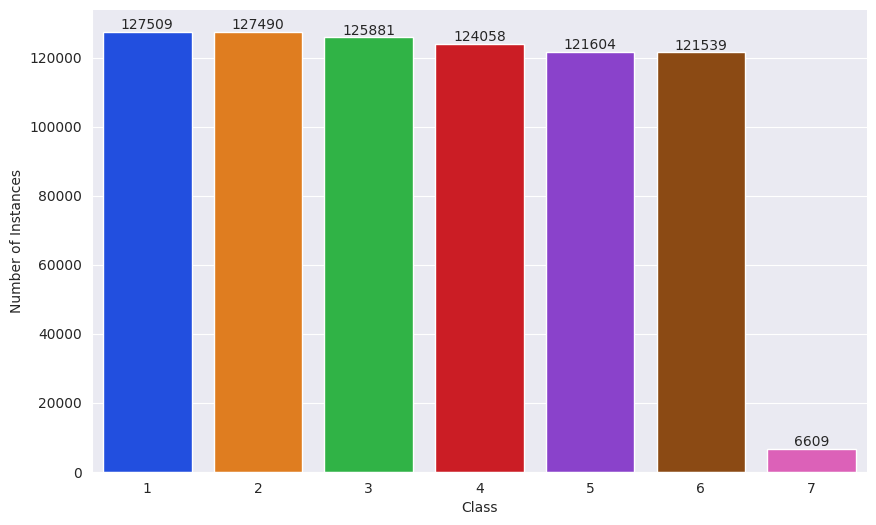

In [ ]:
def plot_class_instances(y):
    targets = y.unique()
    instances = y.value_counts().to_list()
    color_palette = sns.color_palette("bright", len(targets))
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.barplot(x=targets, y=instances, palette=color_palette, ax=ax)
    ax.set(xlabel='Class', ylabel='Number of Instances')
    sns.despine()

    for i, label in enumerate(instances):
        ax.annotate(label, (i, instances[i]), ha='center', va='bottom', fontsize=10)

    plt.savefig('Plots/class_instances.png', dpi=900)
    plt.show()

# plot class instances with data labelled 0 removed
plot_class_instances(all_train[all_train['class'] != 0]['class'])


## Data Preprocessing

In [ ]:
# Check for missing values
print(all_train.isnull().sum())

time          0
channel1      0
channel2      0
channel3      0
channel4      0
channel5      0
channel6      0
channel7      0
channel8      0
class         0
subject_id    0
dtype: int64


In [ ]:
print(all_test.isnull().sum())

time          0
channel1      0
channel2      0
channel3      0
channel4      0
channel5      0
channel6      0
channel7      0
channel8      0
class         1
subject_id    0
dtype: int64


In [ ]:
# Fill missing value with 0
all_test = all_test.dropna()
# all_test = all_test.fillna(0)

In [ ]:
# Check for missing values
print(all_test.isnull().sum())

time          0
channel1      0
channel2      0
channel3      0
channel4      0
channel5      0
channel6      0
channel7      0
channel8      0
class         0
subject_id    0
dtype: int64


In [ ]:
# Check for outliers
print(all_train.describe())

               time      channel1      channel2      channel3      channel4  \
count  2.041937e+06  2.041937e+06  2.041937e+06  2.041937e+06  2.041937e+06   
mean   2.997360e+04 -8.167568e-06 -9.512287e-06 -9.612495e-06 -9.633035e-06   
std    1.797005e+04  1.634088e-04  1.178507e-04  1.206633e-04  2.273340e-04   
min    1.000000e+00 -1.280000e-03 -1.280000e-03 -1.280000e-03 -1.280000e-03   
25%    1.472400e+04 -3.000000e-05 -4.000000e-05 -4.000000e-05 -6.000000e-05   
50%    2.941300e+04 -1.000000e-05 -1.000000e-05 -1.000000e-05 -1.000000e-05   
75%    4.411400e+04  2.000000e-05  2.000000e-05  3.000000e-05  4.000000e-05   
max    8.135700e+04  1.270000e-03  1.270000e-03  1.270000e-03  1.270000e-03   

           channel5      channel6      channel7      channel8         class  \
count  2.041937e+06  2.041937e+06  2.041937e+06  2.041937e+06  2.041937e+06   
mean  -1.639132e-05 -1.065175e-05 -9.494269e-06 -1.013566e-05  1.316184e+00   
std    2.775514e-04  2.160535e-04  1.527449e-04  1.

In [ ]:
all_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2041937 entries, 0 to 2041936
Data columns (total 11 columns):
 #   Column      Dtype  
---  ------      -----  
 0   time        int64  
 1   channel1    float64
 2   channel2    float64
 3   channel3    float64
 4   channel4    float64
 5   channel5    float64
 6   channel6    float64
 7   channel7    float64
 8   channel8    float64
 9   class       int64  
 10  subject_id  int16  
dtypes: float64(8), int16(1), int64(2)
memory usage: 159.7 MB


### Holdout Data

In [ ]:
holdout_data_train = all_train.loc[all_train['class'] == 0]
holdout_data_test = all_test.loc[all_test['class'] == 0]
holdout_data = pd.concat([holdout_data_train, holdout_data_test], axis=0)
holdout_data = holdout_data.reset_index(drop=True)

In [ ]:
holdout_data

,time,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8,class,subject_id
0,2,-0.00001,-0.00004,-0.00002,-0.00002,-0.00001,-0.00001,0.00001,-0.00003,0.0,1
1,6,-0.00001,-0.00004,-0.00002,-0.00002,-0.00001,-0.00001,0.00001,-0.00003,0.0,1
2,7,-0.00001,-0.00004,-0.00002,-0.00002,-0.00001,-0.00001,0.00001,-0.00003,0.0,1
3,8,-0.00003,-0.00005,-0.00008,-0.00004,-0.00003,0.00000,-0.00002,0.00000,0.0,1
4,9,-0.00003,-0.00001,0.00000,0.00001,-0.00001,0.00000,0.00000,-0.00002,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...
2725152,54832,-0.00004,-0.00006,-0.00008,-0.00014,-0.00002,0.00000,-0.00002,-0.00001,0.0,36
2725153,54833,-0.00004,-0.00006,-0.00008,-0.00014,-0.00002,0.00000,-0.00002,-0.00001,0.0,36
2725154,54834,-0.00004,-0.00006,-0.00008,-0.00014,-0.00002,0.00000,-0.00002,-0.00001,0.0,36
2725155,54835,-0.00004,-0.00006,-0.00008,-0.00014,-0.00002,0.00000,-0.00002,-0.00001,0.0,36


#### Plot Data

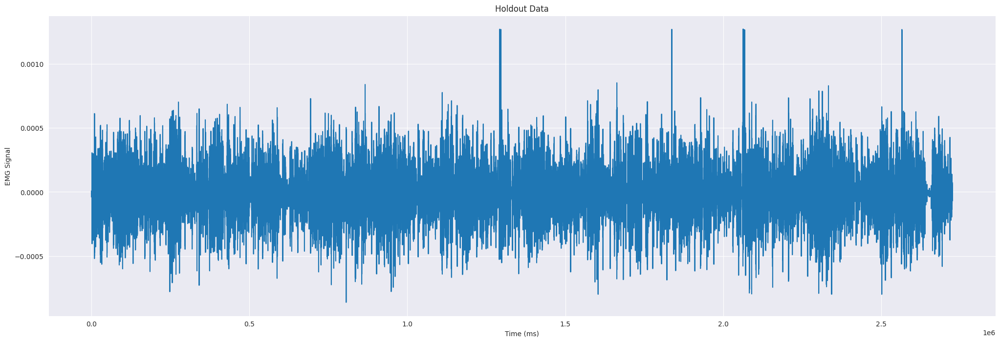

In [ ]:
# Plot Holdout data
plt.figure(figsize=(25,8))
plt.plot(holdout_data[holdout_data['class'] == 0].iloc[:, 1:8].mean(axis=1))

# Add a legend and set the title and axis labels
plt.title('Holdout Data')
plt.xlabel('Time (ms)')
plt.ylabel('EMG Signal')
# Show the plot
plt.show()

### Train Test Split

The overall data is collected for 36 subjects, who perform a series of gestures with an interval of 3 seconds. These subjects perform these activities twice. For the sake of consistency, we will consider the first trial as our training data and the second trial as our test data. Also, the data contains unmarked gestures (class = 0), which we have separated out as holdout.

In [ ]:
labeled_train = all_train.loc[(all_train['class'] != 0) & (all_train['class'] != 7)]
labeled_train = labeled_train.reset_index(drop=True)

labeled_test = all_test.loc[(all_test['class'] != 0) & (all_test['class'] != 7)]
labeled_test = labeled_test.reset_index(drop=True)

In [ ]:
print("Labeled Train Shape: ", labeled_train.shape)
labeled_train

Labeled Train Shape:  (748081, 11)


,time,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8,class,subject_id
0,880,-0.00003,-0.00004,-0.00006,-0.00006,-0.00004,-0.00002,-0.00001,-0.00002,1,1
1,881,-0.00003,-0.00004,-0.00006,-0.00006,-0.00004,-0.00002,-0.00001,-0.00002,1,1
2,882,-0.00003,-0.00004,-0.00006,-0.00006,-0.00004,-0.00002,-0.00001,-0.00002,1,1
3,883,-0.00003,-0.00004,-0.00006,-0.00006,-0.00004,-0.00002,-0.00001,-0.00002,1,1
4,884,-0.00003,-0.00004,-0.00006,-0.00006,-0.00004,-0.00002,-0.00001,-0.00002,1,1
...,...,...,...,...,...,...,...,...,...,...,...
748076,50226,0.00009,0.00001,0.00003,0.00001,-0.00003,-0.00008,0.00004,0.00000,6,36
748077,50227,0.00009,0.00001,0.00003,0.00001,-0.00003,-0.00008,0.00004,0.00000,6,36
748078,50228,0.00009,0.00001,0.00003,0.00001,-0.00003,-0.00008,0.00004,0.00000,6,36
748079,50229,0.00014,0.00003,-0.00001,0.00001,-0.00012,0.00006,-0.00007,-0.00013,6,36


In [ ]:
labeled_test

,time,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8,class,subject_id
0,2400,-0.00001,0.00000,-0.00001,0.00000,0.00000,-0.00001,-0.00001,0.00001,1.0,1
1,2401,-0.00001,-0.00002,0.00000,-0.00001,-0.00001,-0.00001,-0.00003,-0.00002,1.0,1
2,2402,-0.00001,-0.00002,0.00000,-0.00001,-0.00001,-0.00001,-0.00003,-0.00002,1.0,1
3,2403,-0.00001,-0.00002,0.00000,-0.00001,-0.00001,-0.00001,-0.00003,-0.00002,1.0,1
4,2404,-0.00001,-0.00002,0.00000,-0.00001,-0.00001,-0.00001,-0.00003,-0.00002,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...
750968,53577,0.00001,0.00000,-0.00002,0.00002,-0.00010,0.00004,-0.00003,-0.00004,6.0,36
750969,53578,0.00001,0.00000,-0.00002,0.00002,-0.00010,0.00004,-0.00003,-0.00004,6.0,36
750970,53579,0.00005,0.00002,0.00000,0.00000,-0.00005,-0.00005,-0.00004,-0.00001,6.0,36
750971,53580,0.00005,0.00002,0.00000,0.00000,-0.00005,-0.00005,-0.00004,-0.00001,6.0,36


#### Plot Data

In [ ]:
def plot_labeled_data(df, str_title, filename):
    # Create a dictionary of gestures and their corresponding colors
    gesture_colors = {1: 'blue', 2: 'orange', 3: 'green', 4: 'red', 5: 'purple', 6: 'brown', 7: 'pink'}
    fig, axs = plt.subplots(nrows=8, ncols=1, figsize=(25,40))
    # Iterate through each gesture and plot it with a different color
    for i, gesture in enumerate(gesture_colors):
        gesture_data = df[df['class'] == gesture].iloc[:, 1:9]
        for channel in range(8):
            axs[channel].plot(gesture_data.iloc[:, channel], color=gesture_colors[gesture], label=f'Gesture {gesture}')
            axs[channel].set_title(f'Channel {channel+1}')
            axs[channel].set_xlabel('Time (ms)')
            axs[channel].set_ylabel('EMG Signal')
            axs[channel].legend(loc='lower right')

    # Add a legend and set the title and axis labels
    fig.suptitle(str_title, fontsize=20)
    plt.tight_layout()
    # Show the plot
    plt.savefig(filename, dpi=500, bbox_inches="tight");
    plt.show()


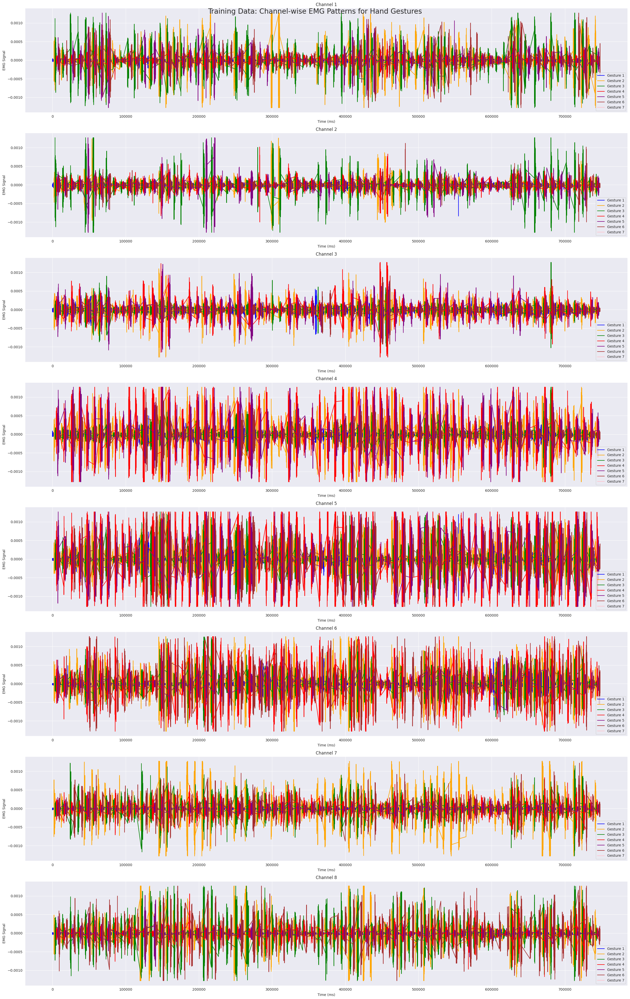

In [ ]:
plot_labeled_data(labeled_train, 
                  'Training Data: Channel-wise EMG Patterns for Hand Gestures', 
                  'Plots/Train_EMG_Channels.png')

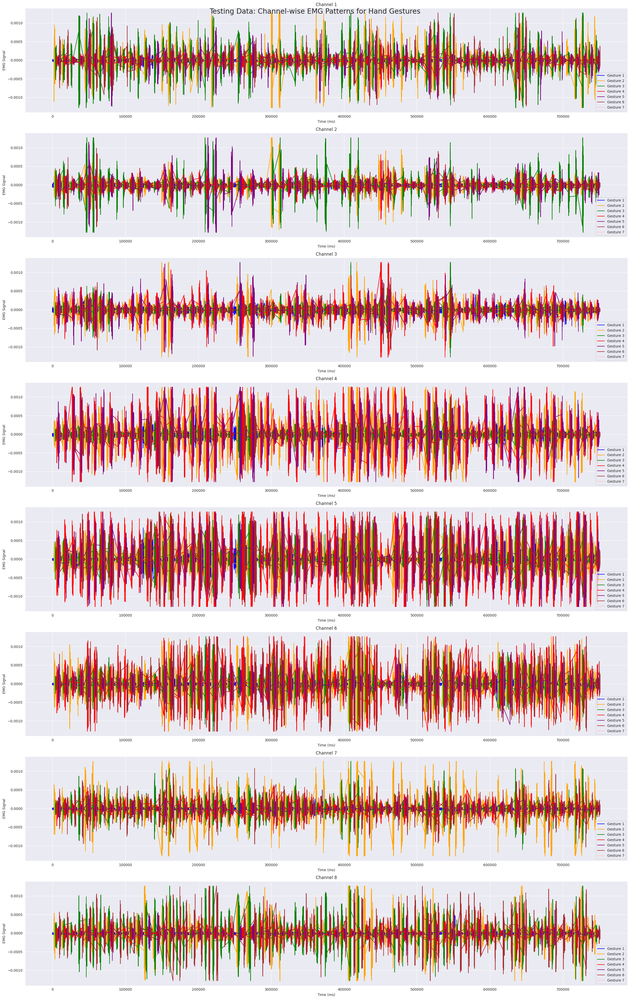

In [ ]:
plot_labeled_data(labeled_test, 
                  'Testing Data: Channel-wise EMG Patterns for Hand Gestures', 
                  'Plots/Test_EMG_Channels.png')

In [ ]:
print('Train Classes: ', labeled_train['class'].unique())
print('Test Classes: ', labeled_test['class'].unique())

Train Classes:  [1 2 3 4 5 6]
Test Classes:  [1. 2. 3. 4. 5. 6.]


In [ ]:
labeled_test.isna().sum()

time          0
channel1      0
channel2      0
channel3      0
channel4      0
channel5      0
channel6      0
channel7      0
channel8      0
class         0
subject_id    0
dtype: int64

## Feature Engineering

### Frequency Domain

In [ ]:
def generate_segments(data_length, segment_length, span):
    # Calculate the number of segments based on the desired length of each segment
    num_segments = int(data_length / segment_length)

    # Create a list of tuples representing each segment needed for processing
    segments = []
    for i in range(num_segments):
        # Calculate the center of the segment and its range start and end positions
        segment_center = i * segment_length + int(segment_length / 2)
        segment_start = max(0, int(segment_center - span / 2))
        segment_end = min(segment_center + span / 2, data_length - 1)
        segments.append((int(segment_start), int(segment_end)))

    # Return the list of segment tuples
    return segments

def refactor_amplitude(channel_data, segment_ranges):
    # Initialize an empty list to hold the refactored amplitude values
    refactored_data = []

    # Iterate through each segment range and calculate the average peak amplitude within that range
    for segment_range in segment_ranges:
        segment_data = channel_data[segment_range[0]:segment_range[1]]

        # Find the peak amplitudes within the segment
        peak_indices = find_peaks(segment_data)[0]
        peaks = [segment_data[ind] for ind in peak_indices]

        # Calculate the average peak amplitude within the segment
        if len(peaks) > 0:
            avg_peak_amplitude = sum(peaks) / len(peaks)
            refactored_data.append(avg_peak_amplitude)
        else:
            # If there are no peaks within the segment, calculate the average amplitude instead
            avg_amplitude = sum(segment_data) / len(segment_data)
            refactored_data.append(avg_amplitude)

    # Return the list of refactored amplitude values
    return refactored_data


def refactor_labels(class_data, segment_ranges):
    # Initialize an empty list to hold the refactored label values
    refactored_class = []

    # Iterate through each segment range and calculate the mode label within that range
    for segment_range in segment_ranges:
        segment_data = class_data[segment_range[0]:segment_range[1]]

        # Find the mode label within the segment
        unique_labels, label_counts = np.unique(segment_data, return_counts=True)
        mode_label = max(dict(zip(unique_labels, label_counts)).items(), key=operator.itemgetter(1))[0]

        refactored_class.append(mode_label)

    # Return the list of refactored label values
    return refactored_class


### Catch 22

In [ ]:
def refactor_catch22(channel,channel_data, segment_ranges):
    # Initialize an empty list to hold the refactored Catch22 feature values
    refactored_data = []
    # Iterate through each segment range and calculate the Catch22 features within that range
    for segment_range in segment_ranges:
        segment_data = channel_data[segment_range[0]:segment_range[1]]

        # Calculate the Catch22 features within the segment
        segment_features = pycatch22.catch22_all(segment_data)
        
        refactored_data.append(dict(zip([name + channel for name in segment_features['names']], segment_features['values'])))

    # Return the list of refactored Catch22 feature values
    return pd.DataFrame(refactored_data)


In [ ]:
def compile_data(df, segment_num = 320, span=1000):
    catch22_list = []
    all_subject_data = []
    # iterate over each subject in the data
    for subject_id in df['subject_id'].unique():
        print('Processing Subject: ', subject_id)
        refactored_data = pd.DataFrame(index=[], columns=[])
        catch22_data = pd.DataFrame(index=[], columns=[])
        # iterate over each channel in the data
        for channel in tqdm(CHANNELS,colour='blue'):
            sub_df = df.loc[df['subject_id']==subject_id, channel].values
            segment_len = len(sub_df) / segment_num
            ranges = generate_segments(len(sub_df), segment_len, span)
            # apply amplitude refactoring
            refactored_channel_data = refactor_amplitude(sub_df, ranges)
            refactored_data[channel] = refactored_channel_data
            # apply catch22 feature engineering to each subject-channel pair 
            catch22_features = refactor_catch22(channel,sub_df, ranges)
            refactored_data = pd.concat((refactored_data,catch22_features),axis=1)
            #[for featurea in catch22_features]
            #catch22_data[channel] = catch22_features.tolist()
        refactored_data['subject_id'] = subject_id
        # catch22_data['subject_id'] = subject_id
        sub_df2 = df.loc[df['subject_id']==subject_id, ['class', 'time']].values
        class_refactor = refactor_labels(sub_df2[:,0], ranges)
        time_refactor = refactor_labels(sub_df2[:,1], ranges)
        refactored_data["time"] = time_refactor
        refactored_data["class"] = class_refactor

        seg_data = (refactored_data['time'] - 1) // 320 + 1
        refactored_data['segment'] = seg_data.values
        # catch22_data['segment'] = seg_data.values
        #Add a new column to identify the segment number
        refactored_data['segment'] = (refactored_data['time'] - 1) // (320 + 1)
        all_subject_data.append(refactored_data)
        # catch22_list.append(catch22_data)
    # Concatenate all the dataframes into a single dataframe
    concatenated_data = pd.concat(all_subject_data)
    # catch22_list = pd.concat(catch22_list)
    # normalise the data
    # concatenated_data.iloc[:,0:8] = (concatenated_data.iloc[:,0:8] - np.mean(concatenated_data.iloc[:,0:8], axis=0)) / np.std(concatenated_data.iloc[:,0:8], axis=0)
    print('\n--- Completed Processing ---')
    return concatenated_data #, catch22_list

In [ ]:
def compile_data_threaded(df, segment_num=320, span=1000):
    results = []
    threads = []

    def process_subject(subject_id):
        print('Processing Subject: ', subject_id)
        subject_data = df.loc[df['subject_id'] == subject_id].copy()
        subject_result = compile_data(subject_data, segment_num, span)
        results.append(subject_result)

    # iterate over each subject in the data
    for subject_id in df['subject_id'].unique():
        thread = threading.Thread(target=process_subject, args=(subject_id,))
        threads.append(thread)
        thread.start()

    # Wait for all threads to finish
    for thread in threads:
        thread.join()

    # Combine results from all subjects into a single dataframe
    concatenated_data = pd.concat([r for r in results])
    # catch22_list = pd.concat([r[1] for r in results])

    # normalise the channel data only
    for channel in CHANNELS:
        concatenated_data.loc[:,channel] = (concatenated_data.loc[:,channel] - np.mean(concatenated_data.loc[:,channel], axis=0)) / np.std(concatenated_data.loc[:,channel], axis=0)

    return concatenated_data #, catch22_list


In [ ]:
print('Train Data Processing')
compiled_train = compile_data_threaded(labeled_train, segment_num = NUM_SEGMENTS, span=SAMPLING_FREQ)

print('\nTest Data Processing')
compiled_test = compile_data_threaded(labeled_test, segment_num = NUM_SEGMENTS, span=1000)

Train Data Processing
Processing Subject:  1
Processing Subject: Processing Subject:  2
 1
Processing Subject:  Processing Subject:  4
Processing Subject:  4
Processing Subject: 3
 5



  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  2
Processing Subject:  3
Processing Subject:  6
Processing Subject:  6
Processing Subject:  5
Processing Subject: 



  0%|          | 0/8 [00:00<?, ?it/s]

 7
Processing Subject:  8


Processing Subject:  9
Processing Subject:  10
Processing Subject:  8
Processing Subject:  7
Processing Subject:  11
Processing Subject:  9


  0%|          | 0/8 [00:00<?, ?it/s]





Processing Subject:  10
Processing Subject:  12
Processing Subject:  11
Processing Subject:  13


  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  12
Processing Subject:  14
Processing Subject: Processing Subject: 

 13
 15
Processing Subject:  14
Processing Subject: Processing Subject:  15
 16







  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  17
Processing Subject:  17
Processing Subject:  16


Processing Subject:  18


  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  19
Processing Subject:  20
Processing Subject:  18
Processing Subject: Processing Subject:  21 20



Processing Subject:  19


  0%|          | 0/8 [00:00<?, ?it/s]











Processing Subject:  22
Processing Subject:  21
Processing Subject:  22
Processing Subject:  23
Processing Subject:  23
Processing Subject:  Processing Subject:  25
Processing Subject:  26


  0%|          | 0/8 [00:00<?, ?it/s]

24
Processing Subject: 













  0%|          | 0/8 [00:00<?, ?it/s]

 27
Processing Subject:  26
Processing Subject:  28
Processing Subject: Processing Subject:  24


Processing Subject:  30
Processing Subject:  27
Processing Subject:  29
Processing Subject:  25
Processing Subject:  31
Processing Subject:  32
Processing Subject: Processing Subject:  33
Processing Subject:  34


Processing Subject:  30
 28
Processing Subject:  33
Processing Subject:  34
Processing Subject:  35
Processing Subject:  32
Processing Subject: 

  0%|          | 0/8 [00:00<?, ?it/s]







 31
 36
Processing Subject:  36
Processing Subject:  29


  0%|          | 0/8 [00:00<?, ?it/s]







  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  35















  0%|          | 0/8 [00:00<?, ?it/s]














  0%|          | 0/8 [00:00<?, ?it/s]
















  0%|          | 0/8 [00:00<?, ?it/s]













  0%|          | 0/8 [00:00<?, ?it/s]

















  0%|          | 0/8 [00:00<?, ?it/s]















  0%|          | 0/8 [00:00<?, ?it/s]


















 12%|█▎        | 1/8 [01:02<07:20, 63.00s/it]

 12%|█▎        | 1/8 [01:18<09:10, 78.59s/it]









 12%|█▎        | 1/8 [01:19<09:06, 78.14s/it]






 12%|█▎        | 1/8 [01:21<09:15, 79.29s/it]







 12%|█▎        | 1/8 [01:28<09:41, 83.08s/it]





 12%|█▎        | 1/8 [01:27<09:23, 80.48s/it]










 12%|█▎        | 1/8 [01:28<09:42, 83.23s/it]



 12%|█▎        | 1/8 [01:32<10:27, 89.69s/it]












 12%|█▎        | 1/8 [01:29<10:08, 87.00s/it]


















 ... (more hidden) ...


 12%|█▎        | 1/8 [01:34<10:38, 91.18s/it]
















 12%|█▎        | 1/8 [01:30<10:07, 86.85s/it]














 12%|█▎        | 1/8 [01:33<10:19,


--- Completed Processing ---

--- Completed Processing ---


100%|██████████| 8/8 [11:21<00:00, 85.24s/it]








100%|██████████| 8/8 [11:29<00:00, 86.17s/it]







100%|██████████| 8/8 [11:38<00:00, 88.62s/it]


--- Completed Processing ---




100%|██████████| 8/8 [11:42<00:00, 87.83s/it]


--- Completed Processing ---



100%|██████████| 8/8 [11:43<00:00, 87.99s/it]











 88%|████████▊ | 7/8 [11:36<01:36, 96.92s/it]


--- Completed Processing ---










 88%|████████▊ | 7/8 [11:38<01:37, 97.61s/it]



 88%|████████▊ | 7/8 [11:43<01:39, 99.75s/it]


--- Completed Processing ---



--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---



100%|██████████| 8/8 [12:01<00:00, 89.55s/it]











 88%|████████▊ | 7/8 [12:00<01:39, 99.14s/it] 

















 88%|████████▊ | 7/8 [11:56<01:38, 98.45s/it] 















100%|██████████| 8/8 [12:04<00:00, 90.51s/it]


--- Completed Processing ---



100%|██████████| 8/8 [11:57<00:00, 89.74s/it]






--- Completed Processing ---


 88%|████████▊ | 7/8 [12:06<01:40, 100.83s/it]














100%|██████████| 8/8 [12:03<00:00, 90.46s/it]









--- Completed Processing ---


100%|██████████| 8/8 [12:07<00:00, 90.88s/it]







100%|██████████| 8/8 [12:02<00:00, 88.77s/it]














 88%|████████▊ | 7/8 [12:01<01:39, 99.10s/it]


--- Completed Processing ---


100%|██████████| 8/8 [12:03<00:00, 90.41s/it]










100%|██████████| 8/8 [12:12<00:00, 91.51s/it]













100%|██████████| 8/8 [12:11<00:00, 91.38s/it]



--- Completed Processing ---











 88%|████████▊ | 7/8 [12:14<01:42, 102.65s/it]













 88%|████████▊ | 7/8 [12:13<01:38, 98.52s/it] 

100%|██████████| 8/8 [12:09<00:00, 82.89s/it]




100%|██████████| 8/8 [12:13<00:00, 91.71s/it]

















100%|██████████| 8/8 [12:18<00:00, 92.26s/it]


--- Completed Processing ---



















100%|██████████| 8/8 [12:13<00:00, 83.93s/it]


--- Completed Processing ---


100%|██████████| 8/8 [12:14<00:00, 91.81s/it]


--- Completed Processing ---














100%|██████████| 8/8 [12:24<00:00, 93.12s/it]



--- Completed Processing ---










100%|██████████| 8/8 [12:26<00:00, 81.95s/it]


--- Completed Processing ---


100%|██████████| 8/8 [12:27<00:00, 93.39s/it]


--- Completed Processing ---

--- Completed Processing ---







100%|██████████| 8/8 [12:27<00:00, 81.93s/it]


--- Completed Processing ---

--- Completed Processing ---


100%|██████████| 8/8 [12:27<00:00, 93.46s/it]



--- Completed Processing ---

--- Completed Processing ---



100%|██████████| 8/8 [12:30<00:00, 93.87s/it]












100%|██████████| 8/8 [12:39<00:00, 94.89s/it]


















100%|██████████| 8/8 [12:35<00:00, 94.45s/it]



100%|██████████| 8/8 [12:42<00:00, 95.28s/it]















100%|██████████| 8/8 [12:33<00:00, 94.14s/it]



--- Completed Processing ---

--- Completed Processing ---







100%|██████████| 8/8 [12:44<00:00, 95.50s/it]

















--- Completed Processing ---


100%|██████████| 8/8 [12:39<00:00, 75.42s/it]








100%|██████████| 8/8 [12:39<00:00, 94.89s/it]



--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

Test Data Processing
Processing Subject:  1
Processing Subject:  2
Processing Subject: Processing Subject:  4
Processing Subject:  1
Processing Subject:   Processing Subject:  6
3Processing Subject:  2



  0%|          | 0/8 [00:00<?, ?it/s]

5
Processing Subject:  4
Processing Subject: Processing Subject:  8 7

Processing Subject:  3
Processing Subject:  5
Processing Subject: Processing Subject:  9
 6
Processing Subject:  8
Processing Subject: Processing Subject:  7
 10
Processing Subject:  9
Processing Subject: Processing Subject: 




  0%|          | 0/8 [00:00<?, ?it/s]

 11
 12
Processing Subject:  10
Processing Subject: Processing Subject:  13
 11
Processing Subject:  Processing Subject:  14
12Processing Subject:  15
Processing Subject:  16



Processing Subject: Processing Subject:  16


Processing Subject: Processing Subject:  15
 18
 17
Processing Subject:  14
Processing Subject:  Processing Subject:  19


  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  13
Processing Subject: 18
Processing Subject:  20
 19


Processing Subject: Processing Subject:  17
Processing Subject:  21
Processing Subject:  20






  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:   22
23
Processing Subject:  24


Processing Subject:  23
Processing Subject: Processing Subject:  25
Processing Subject:  21
Processing Subject:  26
Processing Subject:  24
 

  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  22
Processing Subject:  28
27


Processing Subject: Processing Subject:  26
Processing Subject:  25
 Processing Subject:  28
29
Processing Subject:  30
Processing Subject:  31
Processing Subject:  27
Processing Subject:  29


Processing Subject:  Processing Subject:  30
Processing Subject:  31
32


  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  32
Processing Subject:  33
Processing Subject:  34
Processing Subject: Processing Subject:  33


 35
Processing Subject:  35
Processing Subject:  36


Processing Subject:  34


  0%|          | 0/8 [00:00<?, ?it/s]

Processing Subject:  36










  0%|          | 0/8 [00:00<?, ?it/s]











  0%|          | 0/8 [00:00<?, ?it/s]










  0%|          | 0/8 [00:00<?, ?it/s]








  0%|          | 0/8 [00:00<?, ?it/s]









  0%|          | 0/8 [00:00<?, ?it/s]












  0%|          | 0/8 [00:00<?, ?it/s]













  0%|          | 0/8 [00:00<?, ?it/s]

















  0%|          | 0/8 [00:00<?, ?it/s]















  0%|          | 0/8 [00:00<?, ?it/s]














  0%|          | 0/8 [00:00<?, ?it/s]


















 ... (more hidden) ...
















 12%|█▎        | 1/8 [00:59<06:50, 58.64s/it]

 12%|█▎        | 1/8 [01:06<07:26, 63.74s/it]



 12%|█▎        | 1/8 [01:07<07:30, 64.42s/it]






 12%|█▎        | 1/8 [01:10<07:34, 64.90s/it]


 12%|█▎        | 1/8 [01:12<08:05, 69.40s/it]










 12%|█▎        | 1/8 [01:16<08:53, 76.28s/it]





 12%|█▎        | 1/8 [01:20<09:19, 79.87s/it]




 12%|█▎        | 1/8 [01:23<09:41, 83.02s/it]











 12%|█▎        | 1/8 [01:28<10:19, 8


--- Completed Processing ---


















100%|██████████| 8/8 [11:41<00:00, 87.70s/it]



--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---


100%|██████████| 8/8 [11:50<00:00, 88.82s/it]



 88%|████████▊ | 7/8 [11:53<01:38, 98.51s/it]














 88%|████████▊ | 7/8 [11:55<01:37, 97.49s/it] 


--- Completed Processing ---
















 88%|████████▊ | 7/8 [12:04<01:43, 103.34s/it]
















100%|██████████| 8/8 [11:59<00:00, 85.07s/it]


--- Completed Processing ---

--- Completed Processing ---


100%|██████████| 8/8 [11:59<00:00, 89.97s/it]

















 88%|████████▊ | 7/8 [11:59<01:38, 98.62s/it]


--- Completed Processing ---

--- Completed Processing ---















 88%|████████▊ | 7/8 [12:09<01:38, 98.35s/it] 


--- Completed Processing ---











100%|██████████| 8/8 [12:14<00:00, 91.75s/it]











100%|██████████| 8/8 [12:16<00:00, 92.01s/it]




100%|██████████| 8/8 [12:09<00:00, 86.90s/it]







 88%|████████▊ | 7/8 [12:19<01:40, 100.39s/it]





100%|██████████| 8/8 [12:12<00:00, 91.54s/it]







100%|██████████| 8/8 [12:13<00:00, 91.71s/it]



--- Completed Processing ---



100%|██████████| 8/8 [12:20<00:00, 92.62s/it]


--- Completed Processing ---







100%|██████████| 8/8 [12:25<00:00, 93.13s/it]








--- Completed Processing ---


100%|██████████| 8/8 [12:35<00:00, 94.40s/it]










100%|██████████| 8/8 [12:40<00:00, 95.11s/it]


100%|██████████| 8/8 [12:33<00:00, 94.17s/it]



--- Completed Processing ---













 88%|████████▊ | 7/8 [12:34<01:43, 103.35s/it]


--- Completed Processing ---

--- Completed Processing ---








100%|██████████| 8/8 [12:38<00:00, 94.75s/it]


--- Completed Processing ---












100%|██████████| 8/8 [12:39<00:00, 94.90s/it]


--- Completed Processing ---





















100%|██████████| 8/8 [12:43<00:00, 95.45s/it]



--- Completed Processing ---


















100%|██████████| 8/8 [12:46<00:00, 95.83s/it]












100%|██████████| 8/8 [12:52<00:00, 91.39s/it] 


--- Completed Processing ---

--- Completed Processing ---


100%|██████████| 8/8 [12:53<00:00, 96.69s/it]



--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---





100%|██████████| 8/8 [12:50<00:00, 85.26s/it]


--- Completed Processing ---


100%|██████████| 8/8 [12:50<00:00, 96.28s/it]















100%|██████████| 8/8 [12:51<00:00, 96.47s/it]














100%|██████████| 8/8 [12:57<00:00, 97.16s/it]



--- Completed Processing ---



















100%|██████████| 8/8 [12:50<00:00, 96.36s/it]













100%|██████████| 8/8 [12:59<00:00, 83.58s/it]







100%|██████████| 8/8 [13:01<00:00, 97.73s/it]


--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---














100%|██████████| 8/8 [12:52<00:00, 96.50s/it]



--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---

--- Completed Processing ---


In [6]:
# compiled_train.to_csv('compiled_train.csv',index=False)
# compiled_test.to_csv('compiled_test.csv',index=False)
# compiled_train = pd.read_csv('compiled_train.csv')
# compiled_test = pd.read_csv('compiled_test.csv')

In [7]:
compiled_train.head()

,channel1,DN_HistogramMode_5channel1,DN_HistogramMode_10channel1,CO_f1ecacchannel1,CO_FirstMin_acchannel1,CO_HistogramAMI_even_2_5channel1,CO_trev_1_numchannel1,MD_hrv_classic_pnn40channel1,SB_BinaryStats_mean_longstretch1channel1,SB_TransitionMatrix_3ac_sumdiagcovchannel1,PD_PeriodicityWang_th0_01channel1,CO_Embed2_Dist_tau_d_expfit_meandiffchannel1,IN_AutoMutualInfoStats_40_gaussian_fmmichannel1,FC_LocalSimple_mean1_tauresratchannel1,DN_OutlierInclude_p_001_mdrmdchannel1,DN_OutlierInclude_n_001_mdrmdchannel1,SP_Summaries_welch_rect_area_5_1channel1,SB_BinaryStats_diff_longstretch0channel1,SB_MotifThree_quantile_hhchannel1,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel1,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel1,SP_Summaries_welch_rect_centroidchannel1,FC_LocalSimple_mean3_stderrchannel1,channel2,DN_HistogramMode_5channel2,DN_HistogramMode_10channel2,CO_f1ecacchannel2,CO_FirstMin_acchannel2,CO_HistogramAMI_even_2_5channel2,CO_trev_1_numchannel2,MD_hrv_classic_pnn40channel2,SB_BinaryStats_mean_longstretch1channel2,SB_TransitionMatrix_3ac_sumdiagcovchannel2,PD_PeriodicityWang_th0_01channel2,CO_Embed2_Dist_tau_d_expfit_meandiffchannel2,IN_AutoMutualInfoStats_40_gaussian_fmmichannel2,FC_LocalSimple_mean1_tauresratchannel2,DN_OutlierInclude_p_001_mdrmdchannel2,DN_OutlierInclude_n_001_mdrmdchannel2,SP_Summaries_welch_rect_area_5_1channel2,SB_BinaryStats_diff_longstretch0channel2,SB_MotifThree_quantile_hhchannel2,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel2,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel2,SP_Summaries_welch_rect_centroidchannel2,FC_LocalSimple_mean3_stderrchannel2,channel3,DN_HistogramMode_5channel3,DN_HistogramMode_10channel3,CO_f1ecacchannel3,...,channel7,DN_HistogramMode_5channel7,DN_HistogramMode_10channel7,CO_f1ecacchannel7,CO_FirstMin_acchannel7,CO_HistogramAMI_even_2_5channel7,CO_trev_1_numchannel7,MD_hrv_classic_pnn40channel7,SB_BinaryStats_mean_longstretch1channel7,SB_TransitionMatrix_3ac_sumdiagcovchannel7,PD_PeriodicityWang_th0_01channel7,CO_Embed2_Dist_tau_d_expfit_meandiffchannel7,IN_AutoMutualInfoStats_40_gaussian_fmmichannel7,FC_LocalSimple_mean1_tauresratchannel7,DN_OutlierInclude_p_001_mdrmdchannel7,DN_OutlierInclude_n_001_mdrmdchannel7,SP_Summaries_welch_rect_area_5_1channel7,SB_BinaryStats_diff_longstretch0channel7,SB_MotifThree_quantile_hhchannel7,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel7,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel7,SP_Summaries_welch_rect_centroidchannel7,FC_LocalSimple_mean3_stderrchannel7,channel8,DN_HistogramMode_5channel8,DN_HistogramMode_10channel8,CO_f1ecacchannel8,CO_FirstMin_acchannel8,CO_HistogramAMI_even_2_5channel8,CO_trev_1_numchannel8,MD_hrv_classic_pnn40channel8,SB_BinaryStats_mean_longstretch1channel8,SB_TransitionMatrix_3ac_sumdiagcovchannel8,PD_PeriodicityWang_th0_01channel8,CO_Embed2_Dist_tau_d_expfit_meandiffchannel8,IN_AutoMutualInfoStats_40_gaussian_fmmichannel8,FC_LocalSimple_mean1_tauresratchannel8,DN_OutlierInclude_p_001_mdrmdchannel8,DN_OutlierInclude_n_001_mdrmdchannel8,SP_Summaries_welch_rect_area_5_1channel8,SB_BinaryStats_diff_longstretch0channel8,SB_MotifThree_quantile_hhchannel8,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel8,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel8,SP_Summaries_welch_rect_centroidchannel8,FC_LocalSimple_mean3_stderrchannel8,subject_id,time,class,segment
0,-1.009549,-0.463655,0.495755,11.368586,29,1.015077,-0.069434,0.084746,30.0,0.021948,60,0.228813,17.0,0.052632,0.063910,0.266917,0.934078,3.0,1.235329,0.652174,0.478261,0.098175,0.427259,-0.865182,-0.805702,-1.022403,10.957724,28,0.945637,-0.041921,0.082863,55.0,0.002894,125,0.192461,21.0,0.045455,0.058271,0.026316,0.900839,3.0,1.347176,0.543478,0.152174,0.092039,0.482213,-1.025453,0.411285,0.211809,15.622245,...,-1.104988,0.349342,0.091217,9.715536,28,0.612772,0.124373,0.077213,28.0,0.084813,50,0.168545,18.0,0.050000,0.248120,0.379699,0.870821,3.0,1.094205,0.565217,0.391304,0.116583,0.545411,-1.065595,-0.266800,0.011509,10.401234,29,0.892951,-0.

In [8]:
compiled_test.head()

,channel1,DN_HistogramMode_5channel1,DN_HistogramMode_10channel1,CO_f1ecacchannel1,CO_FirstMin_acchannel1,CO_HistogramAMI_even_2_5channel1,CO_trev_1_numchannel1,MD_hrv_classic_pnn40channel1,SB_BinaryStats_mean_longstretch1channel1,SB_TransitionMatrix_3ac_sumdiagcovchannel1,PD_PeriodicityWang_th0_01channel1,CO_Embed2_Dist_tau_d_expfit_meandiffchannel1,IN_AutoMutualInfoStats_40_gaussian_fmmichannel1,FC_LocalSimple_mean1_tauresratchannel1,DN_OutlierInclude_p_001_mdrmdchannel1,DN_OutlierInclude_n_001_mdrmdchannel1,SP_Summaries_welch_rect_area_5_1channel1,SB_BinaryStats_diff_longstretch0channel1,SB_MotifThree_quantile_hhchannel1,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel1,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel1,SP_Summaries_welch_rect_centroidchannel1,FC_LocalSimple_mean3_stderrchannel1,channel2,DN_HistogramMode_5channel2,DN_HistogramMode_10channel2,CO_f1ecacchannel2,CO_FirstMin_acchannel2,CO_HistogramAMI_even_2_5channel2,CO_trev_1_numchannel2,MD_hrv_classic_pnn40channel2,SB_BinaryStats_mean_longstretch1channel2,SB_TransitionMatrix_3ac_sumdiagcovchannel2,PD_PeriodicityWang_th0_01channel2,CO_Embed2_Dist_tau_d_expfit_meandiffchannel2,IN_AutoMutualInfoStats_40_gaussian_fmmichannel2,FC_LocalSimple_mean1_tauresratchannel2,DN_OutlierInclude_p_001_mdrmdchannel2,DN_OutlierInclude_n_001_mdrmdchannel2,SP_Summaries_welch_rect_area_5_1channel2,SB_BinaryStats_diff_longstretch0channel2,SB_MotifThree_quantile_hhchannel2,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel2,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel2,SP_Summaries_welch_rect_centroidchannel2,FC_LocalSimple_mean3_stderrchannel2,channel3,DN_HistogramMode_5channel3,DN_HistogramMode_10channel3,CO_f1ecacchannel3,...,channel7,DN_HistogramMode_5channel7,DN_HistogramMode_10channel7,CO_f1ecacchannel7,CO_FirstMin_acchannel7,CO_HistogramAMI_even_2_5channel7,CO_trev_1_numchannel7,MD_hrv_classic_pnn40channel7,SB_BinaryStats_mean_longstretch1channel7,SB_TransitionMatrix_3ac_sumdiagcovchannel7,PD_PeriodicityWang_th0_01channel7,CO_Embed2_Dist_tau_d_expfit_meandiffchannel7,IN_AutoMutualInfoStats_40_gaussian_fmmichannel7,FC_LocalSimple_mean1_tauresratchannel7,DN_OutlierInclude_p_001_mdrmdchannel7,DN_OutlierInclude_n_001_mdrmdchannel7,SP_Summaries_welch_rect_area_5_1channel7,SB_BinaryStats_diff_longstretch0channel7,SB_MotifThree_quantile_hhchannel7,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel7,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel7,SP_Summaries_welch_rect_centroidchannel7,FC_LocalSimple_mean3_stderrchannel7,channel8,DN_HistogramMode_5channel8,DN_HistogramMode_10channel8,CO_f1ecacchannel8,CO_FirstMin_acchannel8,CO_HistogramAMI_even_2_5channel8,CO_trev_1_numchannel8,MD_hrv_classic_pnn40channel8,SB_BinaryStats_mean_longstretch1channel8,SB_TransitionMatrix_3ac_sumdiagcovchannel8,PD_PeriodicityWang_th0_01channel8,CO_Embed2_Dist_tau_d_expfit_meandiffchannel8,IN_AutoMutualInfoStats_40_gaussian_fmmichannel8,FC_LocalSimple_mean1_tauresratchannel8,DN_OutlierInclude_p_001_mdrmdchannel8,DN_OutlierInclude_n_001_mdrmdchannel8,SP_Summaries_welch_rect_area_5_1channel8,SB_BinaryStats_diff_longstretch0channel8,SB_MotifThree_quantile_hhchannel8,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel8,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel8,SP_Summaries_welch_rect_centroidchannel8,FC_LocalSimple_mean3_stderrchannel8,subject_id,time,class,segment
0,-0.947174,-0.452106,-0.173545,7.834805,20,0.626477,0.009548,0.117424,24.0,0.009909,35,0.173988,17.0,0.055556,-0.733459,-0.179584,0.846834,3.0,0.880782,0.369565,0.869565,0.147262,0.600728,-0.684140,-0.587473,-0.346874,5.513375,15,0.720789,-0.053978,0.126894,31.0,0.008102,20,0.157320,10.0,0.090909,-0.172023,-0.756144,0.824091,3.0,1.350848,0.478261,0.304348,0.220893,0.658995,0.093852,-0.029052,0.191868,7.892129,...,-1.052683,-0.897536,-0.671729,6.177862,22,0.865794,-0.042805,0.107955,44.0,0.024740,36,0.239116,10.0,0.090909,0.145558,-0.098299,0.869093,3.0,1.361957,0.500000,0.456522,0.159534,0.592105,-0.960713,-0.343291,-0.089106,7.058307,20,0.696958

In [ ]:
## NOTE: Code Crashes Google Colab Session

# c22_col = [col[:-8] for col in compiled_train.columns[1:23]]

# for channel in CHANNELS:
#     fig, axes = plt.subplots(nrows=len(c22_col), figsize=(60, 100))
#     for i, col in enumerate(c22_col):
#         compiled_train.boxplot(column=[col + channel], by='class', ax=axes[i])
#         axes[i].set_title(col + " " + channel)
#         axes[i].set_xlabel("")
#     plt.suptitle(channel, y=0.92, fontsize=16)
#     plt.tight_layout()
#     plt.savefig('Plots/catch22_channel_boxplot.png', dpi=500, bbox_inches="tight")


In [ ]:
#train_catch22.to_csv('catch22_freq_dm.csv', index=False)

In [9]:
X_train = compiled_train.drop('class', axis=1)
X_test = compiled_test.drop('class', axis=1)
y_train = compiled_train['class']
y_test = compiled_test['class']

In [10]:
print('DATA SPLITS \n1. Train: {} \n2. Test: {}'.format(X_train.shape, X_test.shape))

DATA SPLITS 
1. Train: (11520, 187) 
2. Test: (11520, 187)


In [11]:
X_train.head()

,channel1,DN_HistogramMode_5channel1,DN_HistogramMode_10channel1,CO_f1ecacchannel1,CO_FirstMin_acchannel1,CO_HistogramAMI_even_2_5channel1,CO_trev_1_numchannel1,MD_hrv_classic_pnn40channel1,SB_BinaryStats_mean_longstretch1channel1,SB_TransitionMatrix_3ac_sumdiagcovchannel1,PD_PeriodicityWang_th0_01channel1,CO_Embed2_Dist_tau_d_expfit_meandiffchannel1,IN_AutoMutualInfoStats_40_gaussian_fmmichannel1,FC_LocalSimple_mean1_tauresratchannel1,DN_OutlierInclude_p_001_mdrmdchannel1,DN_OutlierInclude_n_001_mdrmdchannel1,SP_Summaries_welch_rect_area_5_1channel1,SB_BinaryStats_diff_longstretch0channel1,SB_MotifThree_quantile_hhchannel1,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel1,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel1,SP_Summaries_welch_rect_centroidchannel1,FC_LocalSimple_mean3_stderrchannel1,channel2,DN_HistogramMode_5channel2,DN_HistogramMode_10channel2,CO_f1ecacchannel2,CO_FirstMin_acchannel2,CO_HistogramAMI_even_2_5channel2,CO_trev_1_numchannel2,MD_hrv_classic_pnn40channel2,SB_BinaryStats_mean_longstretch1channel2,SB_TransitionMatrix_3ac_sumdiagcovchannel2,PD_PeriodicityWang_th0_01channel2,CO_Embed2_Dist_tau_d_expfit_meandiffchannel2,IN_AutoMutualInfoStats_40_gaussian_fmmichannel2,FC_LocalSimple_mean1_tauresratchannel2,DN_OutlierInclude_p_001_mdrmdchannel2,DN_OutlierInclude_n_001_mdrmdchannel2,SP_Summaries_welch_rect_area_5_1channel2,SB_BinaryStats_diff_longstretch0channel2,SB_MotifThree_quantile_hhchannel2,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel2,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel2,SP_Summaries_welch_rect_centroidchannel2,FC_LocalSimple_mean3_stderrchannel2,channel3,DN_HistogramMode_5channel3,DN_HistogramMode_10channel3,CO_f1ecacchannel3,...,FC_LocalSimple_mean3_stderrchannel6,channel7,DN_HistogramMode_5channel7,DN_HistogramMode_10channel7,CO_f1ecacchannel7,CO_FirstMin_acchannel7,CO_HistogramAMI_even_2_5channel7,CO_trev_1_numchannel7,MD_hrv_classic_pnn40channel7,SB_BinaryStats_mean_longstretch1channel7,SB_TransitionMatrix_3ac_sumdiagcovchannel7,PD_PeriodicityWang_th0_01channel7,CO_Embed2_Dist_tau_d_expfit_meandiffchannel7,IN_AutoMutualInfoStats_40_gaussian_fmmichannel7,FC_LocalSimple_mean1_tauresratchannel7,DN_OutlierInclude_p_001_mdrmdchannel7,DN_OutlierInclude_n_001_mdrmdchannel7,SP_Summaries_welch_rect_area_5_1channel7,SB_BinaryStats_diff_longstretch0channel7,SB_MotifThree_quantile_hhchannel7,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel7,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel7,SP_Summaries_welch_rect_centroidchannel7,FC_LocalSimple_mean3_stderrchannel7,channel8,DN_HistogramMode_5channel8,DN_HistogramMode_10channel8,CO_f1ecacchannel8,CO_FirstMin_acchannel8,CO_HistogramAMI_even_2_5channel8,CO_trev_1_numchannel8,MD_hrv_classic_pnn40channel8,SB_BinaryStats_mean_longstretch1channel8,SB_TransitionMatrix_3ac_sumdiagcovchannel8,PD_PeriodicityWang_th0_01channel8,CO_Embed2_Dist_tau_d_expfit_meandiffchannel8,IN_AutoMutualInfoStats_40_gaussian_fmmichannel8,FC_LocalSimple_mean1_tauresratchannel8,DN_OutlierInclude_p_001_mdrmdchannel8,DN_OutlierInclude_n_001_mdrmdchannel8,SP_Summaries_welch_rect_area_5_1channel8,SB_BinaryStats_diff_longstretch0channel8,SB_MotifThree_quantile_hhchannel8,SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1channel8,SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1channel8,SP_Summaries_welch_rect_centroidchannel8,FC_LocalSimple_mean3_stderrchannel8,subject_id,time,segment
0,-1.009549,-0.463655,0.495755,11.368586,29,1.015077,-0.069434,0.084746,30.0,0.021948,60,0.228813,17.0,0.052632,0.063910,0.266917,0.934078,3.0,1.235329,0.652174,0.478261,0.098175,0.427259,-0.865182,-0.805702,-1.022403,10.957724,28,0.945637,-0.041921,0.082863,55.0,0.002894,125,0.192461,21.0,0.045455,0.058271,0.026316,0.900839,3.0,1.347176,0.543478,0.152174,0.092039,0.482213,-1.025453,0.411285,0.211809,15.622245,...,0.493484,-1.104988,0.349342,0.091217,9.715536,28,0.612772,0.124373,0.077213,28.0,0.084813,50,0.168545,18.0,0.050000,0.248120,0.379699,0.870821,3.0,1.094205,0.565217,0.391304,0.116583,0.545411,-1.065595,-0.26

## Classical ML - Modeling

### Metrics

In [12]:
class ClassificationMetrics:
    def __init__(self, y_true, y_pred):
        self.y_true = y_true
        self.y_pred = y_pred
        self.classes = np.unique(y_true)
        
    def confusion_matrix(self):
        n_classes = len(self.classes)
        cm = np.zeros((n_classes, n_classes), dtype=int)
        for i in range(n_classes):
            for j in range(n_classes):
                cm[i, j] = np.sum((self.y_true == self.classes[i]) & (self.y_pred == self.classes[j]))
        return cm
    
    def accuracy(self):
        cm = self.confusion_matrix()
        tp = np.sum(np.diag(cm))
        total = np.sum(cm)
        return tp / total
    
    def precision(self, average='macro'):
        cm = self.confusion_matrix()
        if average == 'macro':
            return np.mean([cm[i, i] / np.sum(cm[:, i]) for i in range(len(self.classes))])
        elif average == 'micro':
            tp = np.sum(np.diag(cm))
            total = np.sum(cm)
            return tp / total
        elif average == 'weighted':
            class_counts = np.sum(cm, axis=1)
            weights = class_counts / np.sum(class_counts)
            return np.sum([cm[i, i] / np.sum(cm[:, i]) * weights[i] for i in range(len(self.classes))])
    
    def recall(self, average='macro'):
        cm = self.confusion_matrix()
        if average == 'macro':
            return np.mean([cm[i, i] / np.sum(cm[i, :]) for i in range(len(self.classes))])
        elif average == 'micro':
            tp = np.sum(np.diag(cm))
            total = np.sum(cm)
            return tp / total
        elif average == 'weighted':
            class_counts = np.sum(cm, axis=1)
            weights = class_counts / np.sum(class_counts)
            return np.sum([cm[i, i] / np.sum(cm[i, :]) * weights[i] for i in range(len(self.classes))])
    
    def f1_score(self, average='macro'):
        p = self.precision(average=average)
        r = self.recall(average=average)
        return 2 * (p * r) / (p + r)


In [13]:
def display_clf_metrics(metrics):
    print('Confusion Matrix')
    print(metrics.confusion_matrix())
    print()
    print('Accuracy: {:.4f}'.format(metrics.accuracy()))
    print('Precision: {:.4f}'.format(metrics.precision()))
    print('Recall: {:.4f}'.format(metrics.recall()))
    print('F1 Score: {:.4f}'.format(metrics.f1_score()))

### Logistic Regression (One vs All)

In [ ]:
class LogisticRegression:
    def __init__(self, learning_rate=0.01, max_iter=1000, tol=1e-4, alpha=0):
        self.learning_rate = learning_rate
        self.max_iter = max_iter
        self.tol = tol
        self.alpha = alpha

    def _sigmoid(self, z):
        return 1 / (1 + np.exp(-z))

    def _cost_function(self, X, y):
        z = np.dot(X, self.w)
        h = self._sigmoid(z)
        J = -1 / len(y) * (np.dot(y.T, np.log(h)) + np.dot((1 - y).T, np.log(1 - h)))
        return J

    def _gradient(self, X, y):
        z = np.dot(X, self.w)
        h = self._sigmoid(z)
        grad = 1 / len(y) * np.dot(X.T, (h - y)).reshape(self.w.shape)
        return grad.reshape(-1, 1)

    def _ridge_gradient(self, X, y):
        z = np.dot(X, self.w)
        h = self._sigmoid(z)
        grad = 1 / len(y) * (np.dot(X.T, (h - y)) + self.alpha * self.w).reshape(self.w.shape)
        return grad.reshape(-1, 1)

    def fit(self, X, y):
        # Normalize data
        self.train_mean = np.mean(X, axis=0)
        self.train_std = np.std(X, axis=0)
        X = (X - self.train_mean) / self.train_std

        self.w = np.zeros((X.shape[1], 1))
        for i in range(self.max_iter):
            if self.alpha == 0:
                grad = self._gradient(X, y)
            else:
                grad = self._ridge_gradient(X, y)
            self.w -= self.learning_rate * grad
            if np.linalg.norm(grad) < self.tol:
                break

    def predict(self, X):
        # Normalize data with train mean and std
        X = (X - self.train_mean) / self.train_std
        z = np.dot(X, self.w)
        return self._sigmoid(z)


In [ ]:
def run_LogisticRegression(X_train, X_test, y_train, y_test, learning_rate, max_iter):
    print('**************** Logistic Regression ****************')
    start_time = time.time()
    lr = LogisticRegression(learning_rate = learning_rate, max_iter = max_iter)
    unique_y = y_train.unique()
    category_probabilities = pd.DataFrame()
    for category in unique_y:
        y_train_category = y_train.map(lambda x: 1 if x == category else 0)
        y_train_category = y_train_category.values.reshape(-1, 1)
        lr.fit(X_train.values, y_train_category)
        probability_df = pd.DataFrame(lr.predict(X_test.values))
        category_probabilities = pd.concat((category_probabilities, probability_df), axis=1)
    predictions = category_probabilities.apply(lambda x: np.argmax(x) + 1, axis=1)
    lr_metrics = ClassificationMetrics(y_test, predictions)
    display_clf_metrics(lr_metrics)
    print('\n***** Time Elapsed: {:.4f} seconds *****'.format(time.time() - start_time))

In [ ]:
run_LogisticRegression(X_train, X_test, y_train, y_test, learning_rate = 1e-05, max_iter=10000)

**************** Logistic Regression ****************
Confusion Matrix
[[1866   72    8    2    0   27]
 [ 380 1134  182    6    0  165]
 [ 596   54  816  152    6  302]
 [  88    0  179 1189  426   18]
 [   1    0    3  545 1190  191]
 [ 381    0    0   50  178 1313]]

Accuracy: 0.6517
Precision: 0.6791
Recall: 0.6502
F1 Score: 0.6643

***** Time Elapsed: 108.2305 seconds *****


### Decision Tree Classifier

In [ ]:
class Node:
    def __init__(self, feature=None, threshold=None, left=None, right=None, value=None):
        self.feature = feature        # Index of feature to split on
        self.threshold = threshold    # Threshold value for feature
        self.left = left              # Left child node
        self.right = right            # Right child node
        self.value = value            # Leaf value if this node is a leaf

In [ ]:
class DecisionTreeClf:
    '''
    Author: Debanjan Saha
    Implements Decision Tree Classifier from scratch
    '''
    def __init__(self, max_depth=None):
        self.max_depth = max_depth    # Maximum depth of the tree
        self.root = None              # Root node of the tree

    def fit(self, X, y):
        self.root = self._build_tree(X, y)

    def predict(self, X):
        return np.array([self._traverse_tree(x, self.root) for x in X])

    def _build_tree(self, X, y, depth=0):
        n_samples, n_features = X.shape
        n_labels = len(np.unique(y))

        # If only one class remains or max depth is reached, return leaf node
        if n_labels == 1 or depth == self.max_depth:
            return Node(value=self._most_common_label(y))

        # Find best split by iterating over all features and thresholds
        best_feature, best_threshold = self._best_split(X, y, n_samples, n_features)

        # Split data and create sub-nodes
        left_idxs = X[:, best_feature] < best_threshold
        right_idxs = ~left_idxs
        left = self._build_tree(X[left_idxs], y[left_idxs], depth+1)
        right = self._build_tree(X[right_idxs], y[right_idxs], depth+1)

        # Return internal node with best split
        return Node(feature=best_feature, threshold=best_threshold, left=left, right=right)

    def _best_split(self, X, y, n_samples, n_features):
        best_gain = -1
        best_feature = None
        best_threshold = None

        # Iterate over all features and thresholds to find best split
        for feature in range(n_features):
            thresholds = np.unique(X[:, feature])
            for threshold in thresholds:
                # Split data into left and right based on feature and threshold
                left_idxs = X[:, feature] < threshold
                right_idxs = ~left_idxs
                left_labels, right_labels = y[left_idxs], y[right_idxs]

                # Skip if either side is empty
                if len(left_labels) == 0 or len(right_labels) == 0:
                    continue

                # Calculate information gain for this split
                gain = self._information_gain(y, left_labels, right_labels)

                # Update best split if this one is better
                if gain > best_gain:
                    best_gain = gain
                    best_feature = feature
                    best_threshold = threshold

        return best_feature, best_threshold

    def _information_gain(self, parent, left, right):
        n = len(parent)
        nl, nr = len(left), len(right)
        pl, pr = nl/n, nr/n

        # Calculate entropy of parent and children
        entropy_parent = self._entropy(parent)
        entropy_children = pl * self._entropy(left) + pr * self._entropy(right)

        # Calculate information gain
        return entropy_parent - entropy_children


    def _entropy(self, y):
        _, counts = np.unique(y, return_counts=True)
        probs = counts / len(y)
        entropy = -np.sum(probs * np.log2(probs))
        return entropy

    def _most_common_label(self, y):
        unique, counts = np.unique(y, return_counts=True)
        index = np.argmax(counts)
        return unique[index]

    def _traverse_tree(self, x, node):
        # If node is a leaf, return its value
        if node.value is not None:
            return node.value

        # Traverse left or right depending on feature and threshold
        if x[node.feature] < node.threshold:
            return self._traverse_tree(x, node.left)
        else:
            return self._traverse_tree(x, node.right)


In [ ]:
def run_DecisionTree(X_train, X_test, y_train, y_test, max_depth):
    print('**************** Decision Tree ****************')
    start_time = time.time()
    dt = DecisionTreeClf(max_depth=max_depth)
    dt.fit(X_train.values, y_train.values)
    predictions = dt.predict(X_test.values)
    dt_metrics = ClassificationMetrics(y_test, predictions)
    display_clf_metrics(dt_metrics)
    print('\n***** Time Elapsed: {:.4f} seconds *****'.format(time.time() - start_time))

In [ ]:
run_DecisionTree(X_train, X_test, y_train, y_test, max_depth=10)

**************** Decision Tree ****************
Confusion Matrix
[[1698  143   49   10   40   35]
 [  44 1405  297   16   50   55]
 [  22  161 1394  123  113  113]
 [   3    8   96 1424  287   82]
 [  14   35   42  299 1466   74]
 [  30  108  155   27  117 1485]]

Accuracy: 0.7701
Precision: 0.7735
Recall: 0.7696
F1 Score: 0.7716

***** Time Elapsed: 1893.7931 seconds *****


### Random Forest Classifier

In [ ]:
class RandomForestClf:
    '''
    Author: Debanjan Saha
    Implements Random Forest Classifier from scratch
    '''
    
    def __init__(self, n_trees=100, max_depth=None, min_samples_split=2, max_features=None):
        self.n_trees = n_trees                    # Number of trees in the forest
        self.max_depth = max_depth                # Maximum depth of each tree
        self.min_samples_split = min_samples_split # Minimum number of samples to split a node
        self.max_features = max_features          # Maximum number of features to consider for each split
        self.trees = []                           # List of decision trees in the forest

    def fit(self, X, y):
        n_samples, n_features = X.shape

        # Determine number of features to consider for each split
        if self.max_features is None:
            self.max_features = int(np.sqrt(n_features))

        # Build decision trees for the forest
        for i in range(self.n_trees):
            # Select random subset of samples and features for this tree
            sample_idxs = np.random.choice(n_samples, size=n_samples, replace=True)
            feature_idxs = np.random.choice(n_features, size=self.max_features, replace=False)
            X_subset = X[sample_idxs][:, feature_idxs]
            y_subset = y[sample_idxs]

            # Build decision tree and add to forest
            tree = DecisionTreeClf(max_depth=self.max_depth)
            tree.fit(X_subset, y_subset)
            self.trees.append((tree, feature_idxs))

    def predict(self, X):
        predictions = []
        for i in range(len(X)):
            votes = []
            for tree, feature_idxs in self.trees:
                # Use only selected features for this tree
                X_subset = X[i][feature_idxs].reshape(1, -1)
                vote = tree.predict(X_subset)[0]
                votes.append(vote)
            # Tally votes and choose most common label
            label_counts = np.bincount(votes)
            most_common_label = np.argmax(label_counts)
            predictions.append(most_common_label)
        return np.array(predictions)


In [ ]:
def run_RandomForest(X_train, X_test, y_train, y_test, max_depth):
    print('**************** Random Forest ****************')
    start_time = time.time()
    rf = RandomForestClf(max_depth=max_depth)
    rf.fit(X_train.values, y_train.values)
    predictions = rf.predict(X_test.values)
    rf_metrics = ClassificationMetrics(y_test, predictions)
    display_clf_metrics(rf_metrics)
    print('\n***** Time Elapsed: {:.4f} seconds *****'.format(time.time() - start_time))

In [ ]:
run_RandomForest(X_train, X_test, y_train, y_test, max_depth=10)

**************** Random Forest ****************
Confusion Matrix
[[1841   57    4    5   35   33]
 [  30 1279  103  319   38   98]
 [  41  186 1057  315   57  270]
 [   0   20   34 1629  163   54]
 [  11   34    8  634 1071  172]
 [  26   85   59  210   72 1470]]

Accuracy: 0.7246
Precision: 0.7534
Recall: 0.7239
F1 Score: 0.7383

***** Time Elapsed: 14141.8307 seconds *****


### K Nearest Neighbors (KNN)

In [ ]:
class KNN:

    def __init__(self, k):
        self.k = k

    def euclidean_distance(self, row1, row2):
        distance = 0.0
        for i in range(len(row1)):
            distance = distance + (row1[i] - row2[i])**2
        return np.sqrt(distance)

    def get_neighbors(self, test_row):
        distance = list()
        for train_row in self.X_train.values:
            dist = self.euclidean_distance(test_row, train_row)
            distance.append(dist)
        zipped = list(zip(self.X_train,self.y_train,distance))
        distances = pd.DataFrame(zipped, columns=['X_train','y_train','Distance'])
        distances = distances.sort_values(by=['Distance'])
        distances = distances.head(self.k)
        neighbors = distances['y_train']
        return neighbors

    def predict(self, test_row):
        neighbors = self.get_neighbors(test_row)
        count = [0,0,0,0,0,0]
        neighbors = list(neighbors)
        for i in neighbors:
            index = i - 1
            count[index] +=1
        return (np.argmax(count) + 1)
    
    def fit(self, X_trian, X_test, y_train):
        self.X_train = X_train
        self.X_test = X_test
        self.y_train = y_train
        y_hat = list()
        for row in self.X_test:
            output = self.predict(row)
            y_hat.append(output)
        #accuracy = self.evaluate(y_hat)
        #print("Accuracy = ",accuracy)
        return(np.array(y_hat))
    
  

In [ ]:
def run_KNN(X_train, X_test, y_train, y_test, k_val):
    print('**************** KNN Classifier ****************')
    start_time = time.time()
    knn = KNN(k=k_val)
    predictions = knn.fit(X_train.values, X_test.values, y_train.values)
    # predictions = knn.predict(X_test.values)
    knn_metrics = ClassificationMetrics(y_test, predictions)
    display_clf_metrics(knn_metrics)
    print('\n***** Time Elapsed: {:.4f} seconds *****'.format(time.time() - start_time))

In [ ]:
run_KNN(X_train, X_test, y_train, y_test, k_val=100)

**************** KNN Classifier ****************


## Deep Learning - Modeling

In [14]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.metrics import categorical_accuracy
from keras.optimizers import SGD, Adam
from keras.callbacks import EarlyStopping

In [15]:
X_train = X_train.drop('time', axis=1).values
X_test = X_test.drop('time', axis=1).values
y_train = y_train - 1
y_test = y_test - 1

In [16]:
# Convert y_train to categorical
y_train_cat = keras.utils.to_categorical(y_train, num_classes=6)
y_test_cat = keras.utils.to_categorical(y_test, num_classes=6)

# Set model input-output nodes
input_shape = X_train.shape[1]
output_shape = y_train_cat.shape[1]
print('Input Shape: ', input_shape, '\nOutput Shape: ', output_shape)

Input Shape:  186 
Output Shape:  6


In [17]:
# Define hyperparameters
epochs = 128
batch_size = 64
learning_rate = 0.001
decay = 1e-6

In [18]:
def train_loop(model, X_train, y_train, X_test, y_test, early_stopping=True):
    if early_stopping:
        early_stop = EarlyStopping(monitor='val_loss', patience=10)
        history = model.fit(X_train, y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(X_test, y_test),
                        callbacks=[early_stop])
    else:
        history = model.fit(X_train, y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(X_test, y_test))

    return history

In [19]:
def model_perf_plots(history, train_acc, val_acc):

    fig, axs = plt.subplots(2, 1, figsize=(8,12))
    # Plot train and validation accuracy
    axs[0].plot(history.history['loss'])
    axs[0].plot(history.history['val_loss'])
    axs[0].set_title('Model Loss')
    axs[0].set_ylabel('Loss')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Test'], loc='upper left')
    
    # Plot train and validation accuracy
    axs[1].plot(history.history[train_acc])
    axs[1].plot(history.history[val_acc])
    axs[1].set_title('Model Accuracy')
    axs[1].set_ylabel('Accuracy')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Test'], loc='upper left')
    
    plt.tight_layout()
    plt.show()


### Neural Networks

In [48]:
def neural_network(learning_rate, decay):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_shape))
    model.add(Dropout(0.4))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(output_shape, activation='softmax'))
    opt = keras.optimizers.RMSprop(learning_rate=learning_rate, rho=0.9, epsilon=1e-8)
    model.compile(loss='mse',
                    optimizer=opt,
                    metrics=['mse', 'accuracy'])

    model.summary()
    return model

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_31 (Dense)            (None, 128)               23936     
                                                                 
 dropout_36 (Dropout)        (None, 128)               0         
                                                                 
 dense_32 (Dense)            (None, 64)                8256      
                                                                 
 dropout_37 (Dropout)        (None, 64)                0         
                                                                 
 dense_33 (Dense)            (None, 6)                 390       
                                                                 
Total params: 32,582
Trainable params: 32,582
Non-trainable params: 0
_________________________________________________________________
Epoch 1/128
180/180 [============================

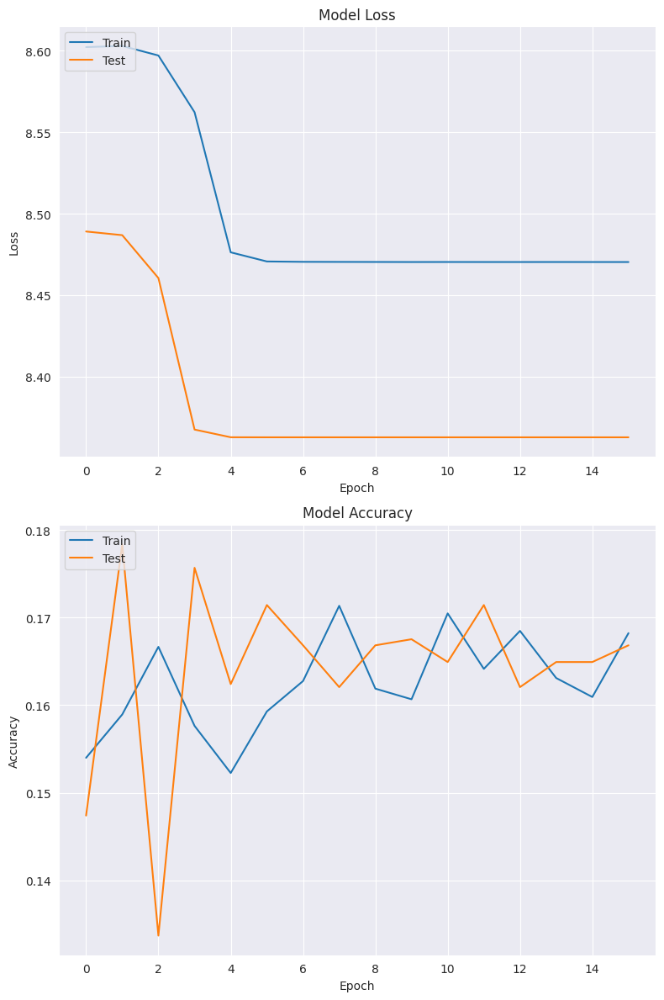

In [49]:
nn_model = neural_network(learning_rate, decay)
history_nn = train_loop(nn_model, X_train, y_train, X_test, y_test)
model_perf_plots(history_nn, 'accuracy', 'val_accuracy')

### Multi Layer Perceptron

In [32]:
def multilayer_perceptron(learning_rate, decay):
    # Create model
    model = Sequential()
    model.add(Dense(1024, activation='relu', input_dim=input_shape))
    # model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.2))
    # model.add(Dense(512, activation='relu'))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(2048, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(output_shape, activation='softmax'))

    # Compile model
    opt = Adam(lr=learning_rate, decay=decay)
    model.compile(loss='categorical_crossentropy',
                optimizer=opt,
                metrics=[categorical_accuracy])

    model.summary()
    return model

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_14 (Dense)            (None, 1024)              191488    
                                                                 
 dropout_10 (Dropout)        (None, 1024)              0         
                                                                 
 dense_15 (Dense)            (None, 256)               262400    
                                                                 
 dense_16 (Dense)            (None, 128)               32896     
                                                                 
 dense_17 (Dense)            (None, 256)               33024     
                                                                 
 dropout_11 (Dropout)        (None, 256)               0         
                                                                 
 dense_18 (Dense)            (None, 1024)             

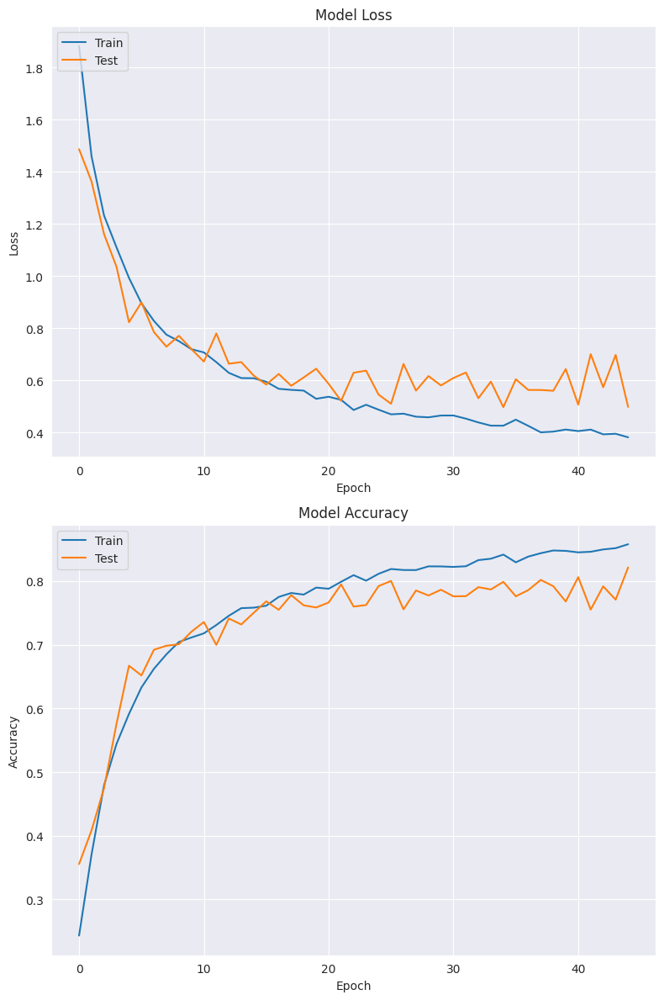

In [33]:
mlp_model = multilayer_perceptron(learning_rate, decay)
history_mlp = train_loop(mlp_model, X_train, y_train_cat, X_test, y_test_cat, early_stopping=True)
model_perf_plots(history_mlp, 'categorical_accuracy', 'val_categorical_accuracy')

## Temporal Transformation

In [24]:
def temporal_tfxm(X, y):
    from keras.utils import to_categorical
    X_temp = X #[:, 0:8]
    y_temp = y.values.copy()
    # y = data[:, 9] - 1 # subtract 1 from each value in y
    num_time_steps = 320
    num_features = X_temp.shape[1]
    num_samples = len(X) // num_time_steps
    X_temp = X_temp[:num_samples * num_time_steps, :]
    X_temp = X_temp.reshape(num_samples, num_time_steps, num_features)
    y_temp = y_temp[:num_samples * num_time_steps]
    y_temp = y_temp.reshape(num_samples, num_time_steps)

    # This will create a new tensor y of shape (num_samples, num_time_steps, num_classes) 
    # where each class label is represented as a binary vector of length 7.
    y_temp = to_categorical(y_temp, num_classes=6)

    print('Transformed X Shape: ', X_temp.shape)
    print('Transformed Y Shape: ', y_temp.shape)
    return X_temp, y_temp

In [25]:
print('Training Data Shape')
X_tem_tr, y_tem_tr = temporal_tfxm(X_train, y_train)
print('Testing Data Shape')
X_tem_ts, y_tem_ts = temporal_tfxm(X_test, y_test)
# X_tem_tr[10,1,1]

Training Data Shape
Transformed X Shape:  (36, 320, 186)
Transformed Y Shape:  (36, 320, 6)
Testing Data Shape
Transformed X Shape:  (36, 320, 186)
Transformed Y Shape:  (36, 320, 6)


## LSTM

### Basic LSTM

In [36]:
from keras.layers import LSTM
from keras.layers import Reshape

def simple_lstm(num_time_steps, num_features, num_classes):
    # Build the model
    model = Sequential()
    model.add(LSTM(128, input_shape=(num_time_steps, num_features), return_sequences=True))
    model.add(Dropout(0.5))
    model.add(LSTM(64, return_sequences=True))
    model.add(Dropout(0.4))
    model.add(Dense(num_classes, activation='softmax'))
    model.add(Reshape((num_time_steps, num_classes)))

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    print(model.summary)
    return model
# # Train the model
# history = model.fit(X, y, epochs=10, batch_size=64, validation_split=0.2)


<bound method Model.summary of <keras.engine.sequential.Sequential object at 0x7f02d23c6e80>>
Epoch 1/128
1/1 [==============================] - 7s 7s/step - loss: 1.8865 - accuracy: 0.1712 - val_loss: 1.7817 - val_accuracy: 0.1836
Epoch 2/128
1/1 [==============================] - 1s 1s/step - loss: 1.8036 - accuracy: 0.1873 - val_loss: 1.7622 - val_accuracy: 0.2346
Epoch 3/128
1/1 [==============================] - 2s 2s/step - loss: 1.7858 - accuracy: 0.2124 - val_loss: 1.7371 - val_accuracy: 0.2567
Epoch 4/128
1/1 [==============================] - 2s 2s/step - loss: 1.7617 - accuracy: 0.2327 - val_loss: 1.7105 - val_accuracy: 0.2783
Epoch 5/128
1/1 [==============================] - 2s 2s/step - loss: 1.7389 - accuracy: 0.2465 - val_loss: 1.6938 - val_accuracy: 0.3020
Epoch 6/128
1/1 [==============================] - 1s 1s/step - loss: 1.7167 - accuracy: 0.2598 - val_loss: 1.6807 - val_accuracy: 0.2948
Epoch 7/128
1/1 [==============================] - 1s 1s/step - loss: 1.6974 -

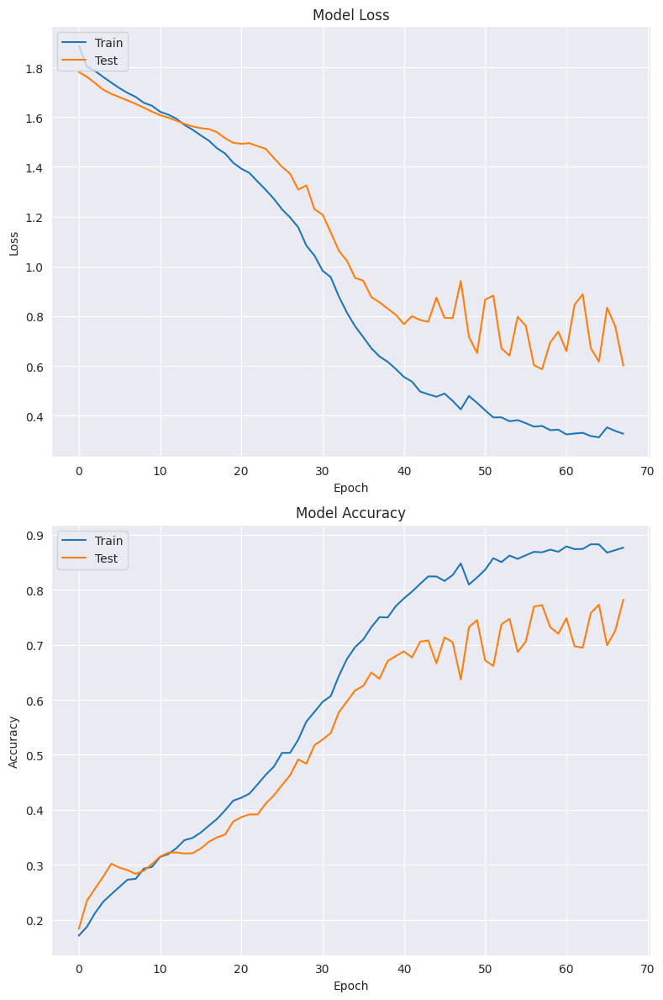

In [37]:
slstm_model = simple_lstm(num_time_steps=320, num_features=186, num_classes=6)
history_slstm = train_loop(slstm_model, X_tem_tr, y_tem_tr, X_tem_ts, y_tem_ts)
model_perf_plots(history_slstm, 'accuracy', 'val_accuracy')

In [50]:
from keras.layers import LSTM
from keras.layers import Reshape

def med_lstm(num_time_steps, num_features, num_classes):
    # Build the model
    model = Sequential()
    model.add(LSTM(128, input_shape=(num_time_steps, num_features), return_sequences=True))
    model.add(Dropout(0.5))
    model.add(LSTM(64, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(64, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(Dense(num_classes, activation='softmax'))
    model.add(Reshape((num_time_steps, num_classes)))

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    print(model.summary)
    return model


<bound method Model.summary of <keras.engine.sequential.Sequential object at 0x7f02efd30fa0>>
Epoch 1/128
1/1 [==============================] - 10s 10s/step - loss: 1.7916 - accuracy: 0.1813 - val_loss: 1.7492 - val_accuracy: 0.2470
Epoch 2/128
1/1 [==============================] - 2s 2s/step - loss: 1.7558 - accuracy: 0.2357 - val_loss: 1.7329 - val_accuracy: 0.2676
Epoch 3/128
1/1 [==============================] - 2s 2s/step - loss: 1.7264 - accuracy: 0.2753 - val_loss: 1.7131 - val_accuracy: 0.2868
Epoch 4/128
1/1 [==============================] - 2s 2s/step - loss: 1.6998 - accuracy: 0.3101 - val_loss: 1.6911 - val_accuracy: 0.3161
Epoch 5/128
1/1 [==============================] - 2s 2s/step - loss: 1.6725 - accuracy: 0.3341 - val_loss: 1.6686 - val_accuracy: 0.3187
Epoch 6/128
1/1 [==============================] - 3s 3s/step - loss: 1.6585 - accuracy: 0.3165 - val_loss: 1.6460 - val_accuracy: 0.3319
Epoch 7/128
1/1 [==============================] - 2s 2s/step - loss: 1.6271

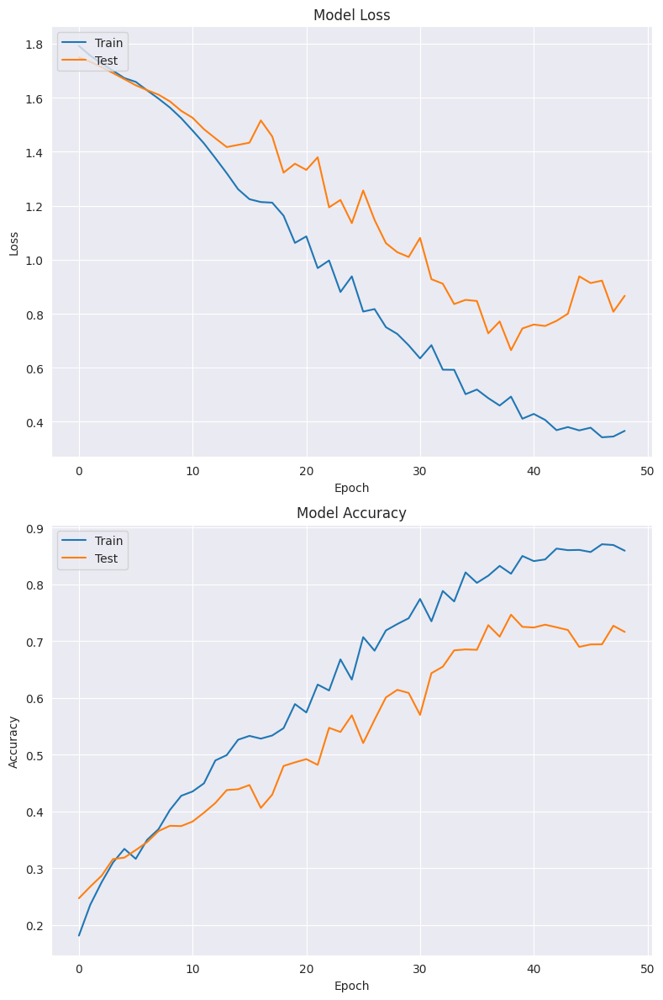

In [51]:
mlstm_model = med_lstm(num_time_steps=320, num_features=186, num_classes=6)
history_mlstm = train_loop(mlstm_model, X_tem_tr, y_tem_tr, X_tem_ts, y_tem_ts)
model_perf_plots(history_mlstm, 'accuracy', 'val_accuracy')

### Advanced LSTM

In [52]:
from keras.layers import LSTM
from keras.layers import Reshape, Flatten

def adv_lstm(num_time_steps, num_features, num_classes):
    # Build the model
    model = Sequential()
    model.add(LSTM(256, input_shape=(num_time_steps, num_features), return_sequences=True))
    model.add(Dropout(0.4))
    model.add(LSTM(128, return_sequences=True))
    model.add(Dropout(0.3))
    model.add(LSTM(64))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(num_time_steps * num_classes, activation='softmax'))
    model.add(Reshape((num_time_steps, num_classes)))

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    print(model.summary())
    return model


Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_30 (LSTM)              (None, 320, 256)          453632    
                                                                 
 dropout_41 (Dropout)        (None, 320, 256)          0         
                                                                 
 lstm_31 (LSTM)              (None, 320, 128)          197120    
                                                                 
 dropout_42 (Dropout)        (None, 320, 128)          0         
                                                                 
 lstm_32 (LSTM)              (None, 64)                49408     
                                                                 
 dropout_43 (Dropout)        (None, 64)                0         
                                                                 
 dense_35 (Dense)            (None, 64)              

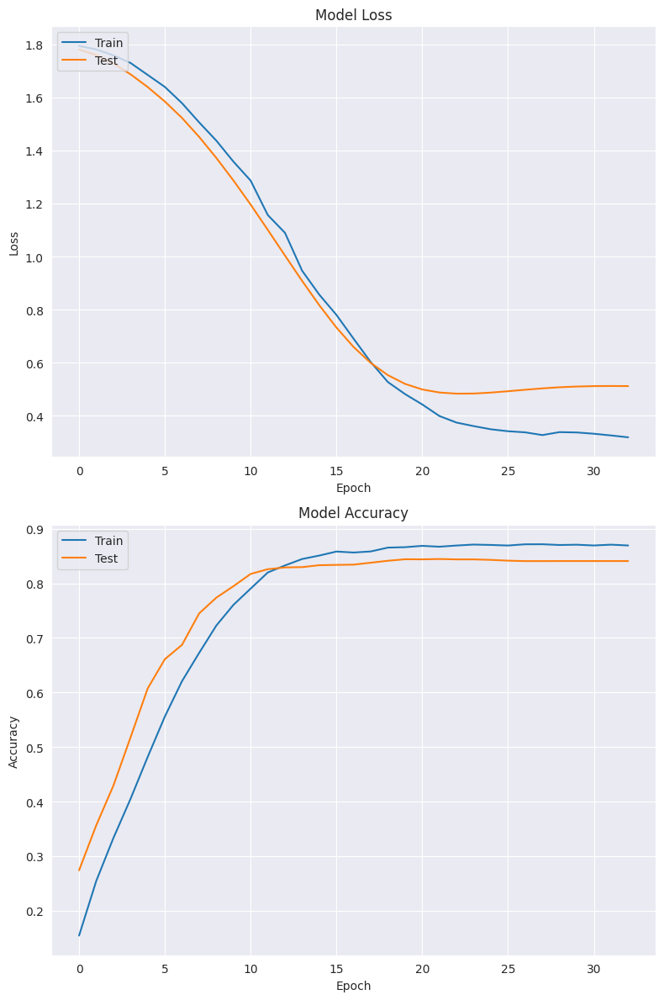

In [53]:
alstm_model = adv_lstm(num_time_steps=320, num_features=186, num_classes=6)
history_alstm = train_loop(alstm_model, X_tem_tr, y_tem_tr, X_tem_ts, y_tem_ts)
model_perf_plots(history_alstm, 'accuracy', 'val_accuracy')